In [1692]:
data.shape

(286392, 35)

<h1 style="color: #34495e; font-family: 'Arial', sans-serif; text-align: center;">Status Analysis, Amazon</h1>

<h1 style="color: #2c3e50; font-family: 'Arial', sans-serif;">00 | <span style="color: #7f8c8d;">Libraries and Settings</span></h2>


 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">All necessary libraries and functions</h2>


In [1]:
# 📚 Basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import chi2_contingency
from scipy.stats.contingency import association
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler 
import matplotlib.pyplot as plt


# 🤖 Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import shap
from sklearn.metrics import accuracy_score

In [3]:
# ⚙️ Settings
pd.set_option('display.max_columns', None) # display all columns
pd.set_option('display.float_format', '{:.2f}'.format)
import warnings
warnings.filterwarnings('ignore') # ignore warnings

In [1701]:
# 🔧 Basic functions

# Standarize and returns Snake columns
def snake_columns(data):
    """
    Standarize and returns snake_case columns
    """
    data.columns=[col.lower().replace(" ","_") for col in data.columns]

# Change to datetime
def change_to_datetime(data):
    """
    Changing date to datetime formate
    """
    data['date'] = pd.to_datetime(data['date'])
    return data

 
# Reordering Columns
def move_column(data, column_name, new_position):
    """
    Function to reorder columns in a DataFrame by position.
    data; column_name: Column to move, new_position: new index.
    """
    col_to_move = df.pop(column_name)  
    df.insert(new_position, column_name, col_to_move)   
    return data

# Tukey's test for outliers
def tukey_test_outliers(data):
    Q1 = data.quantile(0.25)
    Q2 = data.quantile(0.50) 
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    result = { 'Q1': Q1,'Q2 (Median)': Q2, 'Q3': Q3,'IQR': IQR, 'Lower Bound': lower_bound,'Upper Bound': upper_bound,}
    return result

#colors
# Product A: #8DE5A1 (pastel green)
# Product B: #FF9F9B (soft red)
# Product C: #FFC7CE (light pink)
# Product D: #D4A6C8 (pastel lilac)
# Product E: #FABFD2 (lavender pink)
# General: #E5E5E5 
# FFACD - Yellow
# B0E0A8 - Green
# D3D3D3 - Light Gray
# C9A78D - Wood
# B3D9E6 - Blue

<h1 style="color: #34495e; font-family: 'Arial', sans-serif;">01 | Data Extraction 📊</h1>


 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;"> - Data Extraction 📊</h2>


In [9]:
data = pd.read_csv("Amazon Sales 20-21.csv")

#Standarize and returns snake_case columns
snake_columns(data)

data.shape

(286392, 35)

 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">Dataset Documentation</h2>

In [14]:
data.columns

Index(['order_id', 'order_date', 'status', 'item_id', 'sku', 'qty_ordered',
       'price', 'value', 'discount_amount', 'total', 'category',
       'payment_method', 'bi_st', 'cust_id', 'year', 'month', 'ref_num',
       'name_prefix', 'first_name', 'middle_initial', 'last_name', 'gender',
       'age', 'full_name', 'e_mail', 'sign_in_date', 'phone_no._',
       'place_name', 'county', 'city', 'state', 'zip', 'region', 'user_name',
       'discount_percent'],
      dtype='object')

**Documentation** 

**The dataset contains** sales between 2020-10-01 and 2021-09-30, is exactly **1 year**


Descriptions of the columns:

* **order_id**: Unique identifier for the order (it may contain multiple item_id, products).
* **order_date**: The date when the order was placed.
* **status**: The current status of the order (Complete, Canceled,.......).
* **item_id**: A unique identifier for the item ordered.
* **sku**: The stock-keeping unit of the product, used for inventory management.
* **qty_ordered**: The quantity of the item ordered. ----> **num_orders**
* **price**: The price per unit of the item.
* **discount_percent**: The percentage discount applied to the item (if any).
* **value**: The total value of the order is the full cost, whether or not discounts are applied.
* **discount_amount**: The monetary value of the discount applied to the item.
* **total**: The total cost of the order after applying discounts (if any).
* **category**: The product category to which the item belongs, (Fashion, Computing,.......).
* **payment_method**: The method of payment used for the order (credit card, PayPal,.......).
* **bi_st**: Without context.
* **cust_id**: A unique identifier for the customer.
* **year**: Without context.
* **month**: Without context.
* **ref_num**:  All the user's orders on the platform.
* **name_prefix**: The prefix of the customer's name (Mr., Mrs.,.......).
* **first_name**: The first name of the customer.
* **middle_initial**: The middle initial of the customer.
* **last_name**: The last name of the customer.
* **gender**: The gender of the customer.
* **age**: The age of the customer.
* **full_name**: The full name of the customer (first name + last name).
* **e_mail**: The email address of the customer.
* **sign_in_date**: The date when the customer signed in to the platform.
* **phone_no._**: The phone number of the customer.
* **place_name**: The name of the place where the customer resides.
* **county**: The county where the customer resides.
* **city**: The city where the customer resides.
* **state**: The state where the customer resides.
* **zip**: The ZIP code for the customer's.
* **region**: The region where the customer.
* **user_name**: The username of the customer on the platform.
 


 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">Exploring the Data (First Impression)</h2>


In [15]:
data.sample(2)

,order_id,order_date,status,item_id,sku,qty_ordered,price,value,discount_amount,total,category,payment_method,bi_st,cust_id,year,month,ref_num,name_prefix,first_name,middle_initial,last_name,gender,age,full_name,e_mail,sign_in_date,phone_no._,place_name,county,city,state,zip,region,user_name,discount_percent
110592,100474094,10/04/2021,complete,776405,MATMI5A3777766C02A,11,17.50,175.00,0.00,175.00,Mobiles & Tablets,Payaxis,Net,71677,2021,Apr-21,257355,Hon.,Tuyet,B,Hugh,F,68,"Hugh, Tuyet",tuyet.hugh@gmail.com,11/20/2004,205-610-1938,Beatrice,Monroe,Beatrice,AL,36425,South,tbhugh,0.00
268651,100538121,04/07/2021,canceled,864681,WOFSIT5ACB1AA7701B3,7,99.90,599.40,214.02,385.38,Women's Fashion,bankalfalah,Gross,110198,2021,Jul-21,255655,Mr.,Reggie,Q,Smalls,M,74,"Smalls, Reggie",reggie.smalls@charter.net,3/30/1997,405-963-9652,Watson,McCurtain,Watson,OK,74963,South,rqsmalls,35.71


In [16]:
data.columns

Index(['order_id', 'order_date', 'status', 'item_id', 'sku', 'qty_ordered',
       'price', 'value', 'discount_amount', 'total', 'category',
       'payment_method', 'bi_st', 'cust_id', 'year', 'month', 'ref_num',
       'name_prefix', 'first_name', 'middle_initial', 'last_name', 'gender',
       'age', 'full_name', 'e_mail', 'sign_in_date', 'phone_no._',
       'place_name', 'county', 'city', 'state', 'zip', 'region', 'user_name',
       'discount_percent'],
      dtype='object')

In [20]:
data["bi_st"].value_counts()

bi_st
Gross    112333
Net       89144
Valid     84915
Name: count, dtype: int64

In [21]:
data[["order_date","qty_ordered","total","price","status","discount_percent","value","discount_amount"]][:4]

,order_date,qty_ordered,total,price,status,discount_percent,value,discount_amount
0,01/10/2020,21,1798.00,89.90,received,0.00,1798.00,0.00
1,01/10/2020,11,190.00,19.00,received,0.00,190.00,0.00
2,01/10/2020,9,1199.20,149.90,complete,0.00,1199.20,0.00
3,01/10/2020,9,639.20,79.90,complete,0.00,639.20,0.00


In [22]:
data["qty_ordered"].value_counts()

qty_ordered
2      184214
3       43685
1       17572
6        9960
4        8457
        ...  
71          1
188         1
187         1
32          1
381         1
Name: count, Length: 72, dtype: int64

In [25]:
data.sample(2)

,order_id,order_date,status,item_id,sku,qty_ordered,price,value,discount_amount,total,category,payment_method,bi_st,cust_id,year,month,ref_num,name_prefix,first_name,middle_initial,last_name,gender,age,full_name,e_mail,sign_in_date,phone_no._,place_name,county,city,state,zip,region,user_name,discount_percent
118100,100401163,23/12/2020,canceled,653514,MATSAM59DB75ADB2F80,3,1400.00,2800.00,560.00,2240.00,Mobiles & Tablets,Easypay,Gross,73194,2020,Dec-20,457719,Mr.,Jim,L,Corlew,M,74,"Corlew, Jim",jim.corlew@ntlworld.com,4/19/2006,240-758-5200,Temple Hills,Prince George's,Temple Hills,MD,20757,South,jlcorlew,20.00
226479,100488600,27/04/2021,order_refunded,796505,MEFLAS59AD6D9F59B66,2,120.00,120.00,0.00,120.00,Men's Fashion,cod,Valid,97806,2021,Apr-21,330825,Dr.,Gaston,E,Auzenne,M,73,"Auzenne, Gaston",gaston.auzenne@yahoo.co.uk,10/18/2005,314-851-7844,Leonard,Shelby,Leonard,MO,63451,Midwest,geauzenne,0.00


In [31]:
data.shape

(286392, 35)

In [34]:
data["name_prefix"].value_counts()

name_prefix
Mr.      103506
Ms.       60314
Mrs.      47247
Hon.      30439
Drs.      16180
Prof.     14939
Dr.       13767
Name: count, dtype: int64

In [36]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286392 entries, 0 to 286391
Data columns (total 35 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   order_id          286392 non-null  object 
 1   order_date        286392 non-null  object 
 2   status            286392 non-null  object 
 3   item_id           286392 non-null  int64  
 4   sku               286392 non-null  object 
 5   qty_ordered       286392 non-null  int64  
 6   price             286392 non-null  float64
 7   value             286392 non-null  float64
 8   discount_amount   286392 non-null  float64
 9   total             286392 non-null  float64
 10  category          286392 non-null  object 
 11  payment_method    286392 non-null  object 
 12  bi_st             286392 non-null  object 
 13  cust_id           286392 non-null  int64  
 14  year              286392 non-null  int64  
 15  month             286392 non-null  object 
 16  ref_num           28

In [35]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
item_id,286392.00,741664.90,95746.03,574769.00,659684.50,742309.00,826124.25,905208.00
qty_ordered,286392.00,3.01,4.57,1.00,2.00,2.00,3.00,501.00
price,286392.00,851.39,1741.75,0.00,49.90,119.00,950.00,101262.59
value,286392.00,885.88,2073.25,0.00,49.90,158.97,910.00,101262.59
discount_amount,286392.00,70.04,256.88,0.00,0.00,0.00,18.38,30213.15
total,286392.00,815.84,1983.58,0.00,49.90,149.80,800.00,101262.59
cust_id,286392.00,70048.02,30243.86,4.00,56519.00,74225.50,92357.00,115326.00
year,286392.00,2020.62,0.49,2020.00,2020.00,2021.00,2021.00,2021.00
ref_num,286392.00,560853.66,255828.42,111127.00,341265.00,564857.00,781086.00,999981.00
age,286392.00,46.49,16.67,18.00,32.00,47.00,61.00,75.00


<h1 style="color: #34495e; font-family: 'Arial', sans-serif;">02 | Data Cleaning 🧹</h1>


 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">- Copy Data to df & - Adjusting Columns: Spaces and Uppercas</h2>


In [12]:
df = data.copy()


In [14]:
#- Adjusting Columns: Spaces and Uppercas
snake_columns(df)

 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;"> Dropping Features and rename columns</h2>


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> -Fixing Quantity Ordered</h3>


In [18]:
# The column "qty_ordered" was incorrect, created a new column to correct it "num_orders"

df["num_orders"] = df.apply(lambda row: 1 if row["value"] == 0 else row["value"] / row["price"], axis=1)

In [19]:
# format changed to (int)

df["num_orders"] = df["num_orders"].astype(int)

In [20]:
df.drop("qty_ordered", axis=1,inplace=True)


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- (Removing Errors) column Total & Price</h3>


In [24]:
#Removing of 0 values in total.

df["total"].describe().T

count   286392.00
mean       815.84
std       1983.58
min          0.00
25%         49.90
50%        149.80
75%        800.00
max     101262.59
Name: total, dtype: float64

In [26]:
# Out of 652 rows, which represent 0.0024% of the total data, it is clear that this data should be dropped as it is less than 1%

check_below_1 = df[(df["total"] > 0.1) & (df["total"] < 1)]  
# check_below_1

In [28]:
#The result includes 19,146 rows, which represent 7.19% of the total data.
# We decided to drop them as they seem to be a system error that occurred during data creation or with API error. 

check_equal_0 = data[data["total"] == 0]  
# check_equal_0

In [30]:
# The total number of data points less than 1 is 264, which represents a very small portion of the total data

check_below_1_price = df[(df["price"] > 0.1) & (df["price"] < 1)]  
#check_below_1_price

In [32]:
# Drop Values  
 
df.drop(df[df["total"] < 1].index, inplace=True)
df.drop(df[df["price"] < 1].index, inplace=True)

In [1147]:
data.shape

(286392, 35)

In [1149]:
# Verification that there are no longer any values in "total" with a value of 0.

df[(df["total"] > 0.1) & (df["total"] < 1)] 

,order_id,order_date,status,item_id,sku,price,value,discount_amount,total,category,payment_method,bi_st,cust_id,year,month,ref_num,name_prefix,first_name,middle_initial,last_name,gender,age,full_name,e_mail,sign_in_date,phone_no._,place_name,county,city,state,zip,region,user_name,discount_percent,num_orders


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Feature Selection (Dropping Unnecessary Features)</h3>


In [34]:
# These columns do not contribute to the analysis: first_name, middle_initial, last_name, full_name, e_mail, phone_no., user_name , "item_id" column

# The following columns are not well understood and will be excluded from further analysis: bi_st, ref_num, year, month.
 

In [36]:
df.drop(["bi_st","year","month","first_name","middle_initial","last_name","full_name","e_mail","phone_no._","item_id","county","city","zip"], axis=1,inplace=True)


In [38]:
df.sample(0)

,order_id,order_date,status,sku,price,value,discount_amount,total,category,payment_method,cust_id,ref_num,name_prefix,gender,age,sign_in_date,place_name,state,region,user_name,discount_percent,num_orders


 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">- Fixing Data with Incorrect Format and Column Errors 🔄</h2>


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Changed format </h3>


In [66]:
# Changed to datetime format

df["order_date"] = pd.to_datetime(df["order_date"], format="%d/%m/%Y") 
df["sign_in_date"] = pd.to_datetime(df["sign_in_date"], format="%m/%d/%Y") 

In [68]:
# format changed to (int)

df["num_orders"] = df["num_orders"].astype(int)

 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">- Modifying the values inside the columns 🔄</h2>


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Modifiying Status</h3>


In [70]:
# Simplifying Status: Complete and Canceled 
df["status"].value_counts()

status
canceled          101716
complete           84786
received           48642
order_refunded     23485
refund              3625
cod                 2704
paid                 713
closed               164
payment_review        53
pending               40
processing            32
holded                25
pending_paypal         4
Name: count, dtype: int64

In [72]:
df.drop(df[df["status"].isin(["cod","payment_review","holded", "pending_paypal","pending","processing","closed"])].index, inplace=True)

In [74]:
df["status"] = df["status"].replace({"received":"complete", "order_refunded": "canceled", "refund":"canceled","paid":"complete"})

In [76]:
df["status"].value_counts()

status
complete    134141
canceled    128826
Name: count, dtype: int64

 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">Reviewing Cleaned Data  </h2>


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">Checking Null Values</h3>


In [1169]:
df.isnull().sum()

order_id            0
order_date          0
status              0
sku                 0
price               0
value               0
discount_amount     0
total               0
category            0
payment_method      0
cust_id             0
ref_num             0
name_prefix         0
gender              0
age                 0
sign_in_date        0
place_name          0
state               0
region              0
user_name           0
discount_percent    0
num_orders          0
dtype: int64

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">Checking Duplicates</h3>


In [1172]:
df.duplicated().sum() #Checking Duplicates

117

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">Checking Empty Spaces</h3>


In [1175]:
df.eq(" ").sum() #Checking Empty Spaces

order_id            0
order_date          0
status              0
sku                 0
price               0
value               0
discount_amount     0
total               0
category            0
payment_method      0
cust_id             0
ref_num             0
name_prefix         0
gender              0
age                 0
sign_in_date        0
place_name          0
state               0
region              0
user_name           0
discount_percent    0
num_orders          0
dtype: int64

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">Checking Data types</h3>


In [1178]:
#data types

df.dtypes 

order_id                    object
order_date          datetime64[ns]
status                      object
sku                         object
price                      float64
value                      float64
discount_amount            float64
total                      float64
category                    object
payment_method              object
cust_id                      int64
ref_num                      int64
name_prefix                 object
gender                      object
age                          int64
sign_in_date        datetime64[ns]
place_name                  object
state                       object
region                      object
user_name                   object
discount_percent           float64
num_orders                   int32
dtype: object

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Describe Data </h3>


In [75]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
ref_num,262967.00,560462.78,111127.00,340630.00,564113.00,780968.50,999981.00,255959.51
price,262967.00,751.39,1.00,49.90,105.00,684.00,101262.59,1628.64
order_date,262967,2021-03-11 01:08:45.049911040,2020-10-01 00:00:00,2020-12-24 00:00:00,2021-03-13 00:00:00,2021-05-12 00:00:00,2021-09-30 00:00:00,NaN
discount_percent,262967.00,6.12,0.00,0.00,0.00,12.30,75.00,10.46
num_orders,262967.00,3.12,2.00,2.00,2.00,3.00,371.00,3.91
value,262967.00,961.99,1.00,69.80,199.80,1054.10,101262.59,2143.59
discount_amount,262967.00,76.16,0.00,0.00,0.00,31.96,30213.15,266.97
total,262967.00,885.83,1.00,64.90,185.12,974.70,101262.59,2052.06
cust_id,262967.00,70036.66,4.00,56516.00,74222.00,92307.50,115323.00,30138.79
age,262967.00,46.54,18.00,32.00,47.00,61.00,75.00,16.66


<h1 style="color: #34495e; font-family: 'Arial', sans-serif;">03 | EDA (Exploratory Data Analysis) 🔍</h1>

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Reorganizing columns using pop() to improve visualization</h3>


In [78]:
# use funcion to move columns for beter visualization

df = move_column(df, "discount_percent", 7)
df = move_column(df, "price", 6)
df = move_column(df, "value", 7)
df = move_column(df,"num_orders", 6)
df = move_column(df,"ref_num", 2)
df = move_column(df,"order_date", 5)

In [81]:
df.sample(2)

,order_id,ref_num,status,sku,discount_amount,order_date,price,num_orders,discount_percent,value,total,category,payment_method,cust_id,name_prefix,gender,age,sign_in_date,place_name,state,region,user_name
29201,100359832,534799,complete,WOFSIT59BA8FE46D58B,0.00,2020-10-26,110.00,1,0.00,110.00,110.00,Women's Fashion,cod,11869,Mr.,M,46,2000-12-20,Cache Junction,UT,West,eatorres
149756,100422975,862258,complete,APPJAC59E8B211B3349,0.00,2020-12-28,164.90,1,0.00,164.90,164.90,Appliances,cod,79816,Dr.,M,38,2013-12-19,Riverside,CA,West,arhogans


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊 Price </h3>

In [430]:
df.shape

(262967, 25)

In [432]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.hist(filtered_data1['price'], bins=50, edgecolor='black')
plt.title('Distribución de Precios')
plt.xlabel('Precio')
plt.ylabel('Frecuencia')
plt.show()


NameError: name 'filtered_data1' is not defined

<Figure size 1200x600 with 0 Axes>

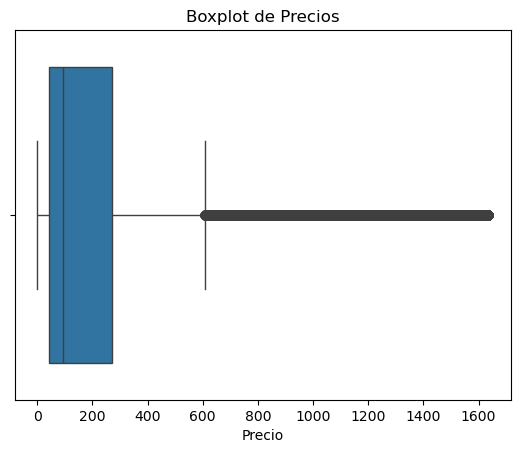

In [89]:
sns.boxplot(x=filtered_data1['price'])
plt.title('Boxplot de Precios')
plt.xlabel('Precio')
plt.show()

In [91]:
filtered_data2 = data_l1[data_l1['price'] <= 400]  # Solo eliminar outliers altos


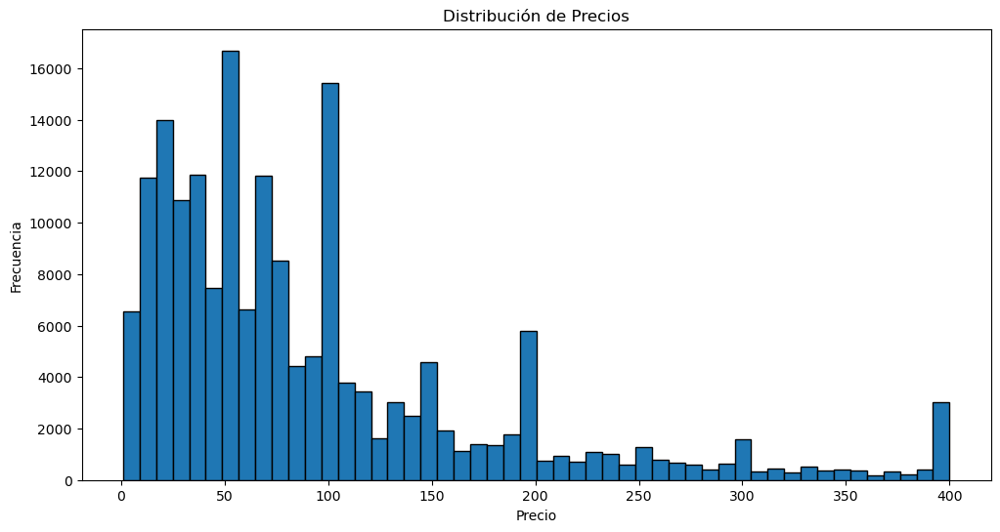

In [93]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.hist(filtered_data2['price'], bins=50, edgecolor='black')
plt.title('Distribución de Precios')
plt.xlabel('Precio')
plt.ylabel('Frecuencia')
plt.show()


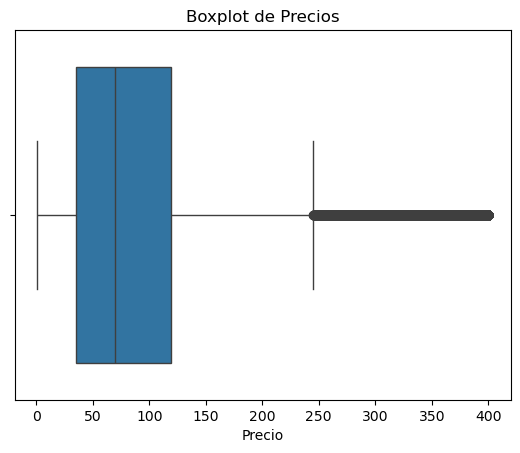

In [95]:
sns.boxplot(x=filtered_data2['price'])
plt.title('Boxplot de Precios')
plt.xlabel('Precio')
plt.show()

In [341]:

p1 = data_l1['price'].quantile(0.01)   
p99 = data_l1['price'].quantile(0.99)   

print(f"Percentil 1%: {p1}")
print(f"Percentil 99%: {p99}")


Percentil 1%: 5.0
Percentil 99%: 8959.9


 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">- Modifiying Products as Premium or Not </h2>


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Categorizing Products as Premium or Not </h3>


In [87]:
df.sample(2)

,order_id,ref_num,status,sku,discount_amount,order_date,price,num_orders,discount_percent,value,total,category,payment_method,cust_id,name_prefix,gender,age,sign_in_date,place_name,state,region,user_name,product_premium_status
267876,100537031,252536,canceled,MEFIGN5ABB86C25DF40-32,0.00,2021-07-03,99.90,2,0.00,299.70,299.70,Men's Fashion,cod,110020,Ms.,F,20,2004-02-18,Bensenville,IL,Midwest,crremick,no
189816,100454117,446547,canceled,OTHPCB5A7D8465A5CEF,0.00,2021-03-20,100.00,3,0.00,300.00,300.00,Others,Easypay,88230,Ms.,F,61,2012-09-08,Avoca,NE,Midwest,eawilbanks,no


In [107]:
def fc_premium_category(df):
    premium_flags = []
    for category, group in df.groupby('category'):
        price_threshold = group['price'].quantile(0.80)  
        group['premium_category'] = group['price'].apply(lambda x: 'yes' if x > price_threshold else 'no')
        premium_flags.append(group)
    df_result = pd.concat(premium_flags)
    return df_result
 

In [109]:
df = fc_premium_category(df)


In [113]:
df["premium_category"].value_counts()

premium_category
no     212306
yes     50661
Name: count, dtype: int64

In [1071]:
# Paso 1: Eliminar outliers usando el upper bound
def remove_outliers(df):
    cleaned_data = []

    # Agrupar por categoría
    for category, group in df.groupby('category'):
        # Calcular Q1, Q3 e IQR
        Q1 = group['price'].quantile(0.25)
        Q3 = group['price'].quantile(0.75)
        IQR = Q3 - Q1
        upper_bound = Q3 + 1.5 * IQR

        # Filtrar datos dentro del rango válido (menores o iguales al upper bound)
        filtered_group = group[group['price'] <= upper_bound]
        cleaned_data.append(filtered_group)

    # Combinar los resultados de todas las categorías
    df_cleaned = pd.concat(cleaned_data)
    return df_cleaned

 


In [1075]:
# Aplicar la función para eliminar outliers
df_cleaned = remove_outliers(df)

df_cleaned.shape

(240278, 26)

In [1077]:
df_cleaned.sample(2)

,order_id,status,ref_num,sku,product_premium_status,premium_yes_no,discount_amount,order_date,num_orders,price,value,discount_percent,total,category,payment_method,cust_id,name_prefix,gender,age,age_category,sign_in_date,place_name,state,region,user_name,premium_category
250835,100517883,canceled,294442,MATMI5A8B9E9E2843A,no,no,0.00,2021-06-05,1,259.90,259.90,0.00,259.90,Mobiles & Tablets,Easypay,106294,Hon.,F,28,young_adults,2008-11-04,Pyote,TX,South,pvsheahan,no
52115,100386045,complete,690850,APPDAW59FF034995959,no,no,173.82,2020-12-20,1,1108.20,1108.20,15.68,934.38,Appliances,easypay_voucher,4,Mr.,M,33,adults,2010-01-04,Springfield,MO,Midwest,rcdoughty,no


In [1079]:
# Paso 2: Calcular el percentil 90 y marcar productos premium
def mark_premium(df_cleaned):
    premium_flags = []

    # Agrupar por categoría
    for category, group in df_cleaned.groupby('category'):
        # Calcular el percentil 90 para la columna 'price'
        price_threshold = group['price'].quantile(0.90)

        # Crear una nueva columna para marcar los productos premium
        group['premium_category'] = group['price'].apply(lambda x: 'yes' if x > price_threshold else 'no')
        premium_flags.append(group)

    # Combinar los resultados
    df_result = pd.concat(premium_flags)
    return df_result

 


In [1081]:
# Aplicar la función a los datos limpios
df_with_premium = mark_premium(df_cleaned)

 

In [1083]:
df_with_premium.shape

(240278, 26)

In [1085]:
df_with_premium.sample(2)

,order_id,status,ref_num,sku,product_premium_status,premium_yes_no,discount_amount,order_date,num_orders,price,value,discount_percent,total,category,payment_method,cust_id,name_prefix,gender,age,age_category,sign_in_date,place_name,state,region,user_name,premium_category
245124,100512655,canceled,529754,APPHOM59FADAC11C1E3,no,no,200.00,2021-05-18,1,1450.00,1450.00,13.79,1250.00,Appliances,Easypay_MA,104775,Ms.,F,34,adults,1999-06-05,Atlanta,GA,South,sqschweitzer,yes
18788,100357466,canceled,743357,MATHQD59AC7B79D8147,no,no,0.00,2020-10-16,1,79.90,79.90,0.00,79.90,Mobiles & Tablets,cod,60944,Ms.,F,63,seniors,2017-07-28,South Haven,MN,Midwest,jdtroxler,no


In [1089]:
# Paso 3: Incluir outliers como automáticamente premium
def include_outliers_as_premium(df, df_cleaned):
    premium_flags = []

    # Agrupar por categoría
    for category, group in df.groupby('category'):
        # Calcular Q1, Q3 e IQR
        Q1 = group['price'].quantile(0.25)
        Q3 = group['price'].quantile(0.75)
        IQR = Q3 - Q1
        upper_bound = Q3 + 1.5 * IQR

        # Filtrar los outliers (valores por encima del upper bound)
        outliers = group[group['price'] > upper_bound]
        outliers['premium_category'] = 'yes'  # Marcar estos como premium automáticamente

        # Filtrar los datos dentro del rango (sin outliers)
        filtered_group = df_cleaned[df_cleaned['category'] == category]

        # Concatenar los datos limpios con los outliers ya marcados
        combined_group = pd.concat([filtered_group, outliers])

        premium_flags.append(combined_group)

    # Combinar todos los grupos
    df_result = pd.concat(premium_flags)
    return df_result

 


In [1091]:
# Aplicar la función para incluir outliers como premium
df_final = include_outliers_as_premium(df, df_cleaned)

 

In [1092]:
df_final.shape

(262967, 26)

In [1095]:
df_final.sample(2)

,order_id,status,ref_num,sku,product_premium_status,premium_yes_no,discount_amount,order_date,num_orders,price,value,discount_percent,total,category,payment_method,cust_id,name_prefix,gender,age,age_category,sign_in_date,place_name,state,region,user_name,premium_category
151482,100424565,complete,585229,MEFALH5A003BBBB9134,no,no,0.00,2020-12-28,1,59.90,59.90,0.00,59.90,Men's Fashion,cod,80185,Ms.,F,53,adults,2017-03-31,Madison,NC,South,sibeer,no
225602,100509010,complete,859278,MATLAZ5A55D66AF06F6,no,no,0.00,2021-05-03,1,75.00,75.00,0.00,75.00,Mobiles & Tablets,cod,97590,Mr.,M,70,seniors,2011-09-21,Marydell,KY,South,gzhugley,no


In [1097]:
df_final["premium_category"].value_counts()

premium_category
no     235192
yes     27775
Name: count, dtype: int64

In [1103]:
import pandas as pd

# Paso 1: Calcular el percentil 80 y ver el 20% superior de cada categoría
def consider_top_20_percent(df):
    premium_flags = []

    for category, group in df.groupby('category'):
        # Calcular el percentil 80 (el valor que separa el 80% inferior del 20% superior)
        price_threshold_80 = group['price'].quantile(0.80)

        # Marcar los productos como premium si están por encima del percentil 80
        group['premium_category'] = group['price'].apply(lambda x: 'yes' if x > price_threshold_80 else 'no')

        # Agregar el grupo procesado a la lista
        premium_flags.append(group)

    # Concatenar los grupos procesados
    df_result = pd.concat(premium_flags)
    return df_result

# Aplicar la función al DataFrame
df_with_top_20 = consider_top_20_percent(df)

# Ver los resultados
print(df_with_top_20[['category', 'price', 'premium_category']].head())


      category  price premium_category
9   Appliances 549.90               no
12  Appliances 254.80               no
13  Appliances 315.50               no
15  Appliances 254.80               no
16  Appliances 315.50               no


In [1107]:
dsadsa = df_with_top_20[['category', 'price', 'premium_category']]

In [1109]:
dsadsa["premium_category"].value_counts()

premium_category
no     212306
yes     50661
Name: count, dtype: int64

In [993]:
# use our function to move 'premium_yes_no' 

df = move_column(df,"product_premium_status", 4)

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Percentage of Premium Products by Category </h3>


In [188]:
premium_category = df.copy()

In [189]:
premium_counts_category = premium_category.groupby(['category', 'premium_category']).size().unstack(fill_value=0)

premium_counts_category["total"] = premium_counts_category["yes"] + premium_counts_category["no"]

premium_counts_category["premium_percentage"] = premium_counts_category["yes"] / premium_counts_category["total"] * 100

premium_counts_category_sorted = premium_counts_category.sort_values(by="premium_percentage", ascending=False)

premium_counts_category_sorted


premium_category,no,yes,total,premium_percentage
category,,,,
Books,261,66,327,20.18
Beauty & Grooming,13652,3413,17065,20.00
Women's Fashion,21807,5446,27253,19.98
Appliances,22814,5692,28506,19.97
Kids & Baby,4984,1243,6227,19.96
School & Education,851,211,1062,19.87
Health & Sports,6589,1633,8222,19.86
Computing,5774,1431,7205,19.86
Mobiles & Tablets,43725,10771,54496,19.76


In [1663]:
premium_counts_category_sorted = premium_counts_category_sorted.reset_index()

In [1665]:
premium_counts_category_sorted

premium_category,category,no,yes,total,premium_percentage
0,Books,261,66,327,20.18
1,Beauty & Grooming,13652,3413,17065,20.00
2,Women's Fashion,21807,5446,27253,19.98
3,Appliances,22814,5692,28506,19.97
4,Kids & Baby,4984,1243,6227,19.96
5,School & Education,851,211,1062,19.87
6,Health & Sports,6589,1633,8222,19.86
7,Computing,5774,1431,7205,19.86
8,Mobiles & Tablets,43725,10771,54496,19.76
9,Home & Living,10585,2600,13185,19.72


In [1207]:
# df["category"].value_counts()

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Price Ourliers per category" </h3>


In [1675]:
test_outliers_category = df.copy() 

In [1677]:
def test_category_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = max(0, Q1 - 1.5 * IQR) #Q1 - 1.5 * IQR   max(0, Q1 - 1.5 * IQR)
    upper_bound = Q3 + 1.5 * IQR
    return lower_bound, upper_bound, IQR

test_outliers_category = test_outliers_category.groupby("category")["price"].apply(test_category_outliers)

test_outliers_category = pd.DataFrame(test_outliers_category.tolist(), index=test_outliers_category.index, columns=["lower_bound", "upper_bound", "IQR"])

test_outliers_category

,lower_bound,upper_bound,IQR
category,,,
Appliances,0.00,2263.80,849.60
Beauty & Grooming,0.00,185.45,64.30
Books,0.00,179.21,62.70
Computing,0.00,1902.65,721.10
Entertainment,602.25,3102.65,625.10
Health & Sports,0.00,189.25,68.90
Home & Living,0.00,151.80,51.20
Kids & Baby,0.00,170.96,60.43
Men's Fashion,0.00,182.40,55.00


In [1684]:
sadasd = df[df["category"] == "Entertainment"][["category", "price"]]


In [1690]:
sadasd.describe().T

,count,mean,std,min,25%,50%,75%,max
price,14207.00,1901.31,1313.90,3.00,1539.90,1895.80,2165.00,32000.00


In [1235]:
# Test to verify if our previous function for marking limits is correct
    
test_test = df[df["premium_category"] == "yes"]
test_test = test_test[test_test["category"] == "Books"][["price", "premium_category", "category"]]
                             # just change here  i

In [1237]:
test_test["price"].min() #result = 179.5     [ # Books -> upper_bound  = 179.21 ] 

199.5

In [1239]:
test_test["price"].min()  #result = 2272.8   [# Appliances -> upper_bound  = 2263.80]

199.5

 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">- Modifiying payment_method</h2>


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Payment Reduction: Categorizing Low-Value Transactions as 'Others </h3>


In [195]:
# Payment Reduction: Grouping Low-Value Transactions as "Others"

df["payment_method"] = df["payment_method"].replace({"customercredit":"others", "apg": "others", "mcblite":"others","cashatdoorstep":"others","financesettlement":"others"})


In [197]:
df["payment_method"].value_counts()

payment_method
cod                96300
Easypay            65071
Payaxis            28881
easypay_voucher    25594
bankalfalah        20639
Easypay_MA         10701
jazzwallet          6114
others              4927
jazzvoucher         4740
Name: count, dtype: int64

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Cancellation Rate by Payment Method </h3>


 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Payment Method Analysis: Cancellation % 🔧 </h4>


In [201]:
# status	canceled	complete
filtered_method = df[df["status"].isin(["complete", "canceled"])]
method_counts = filtered_method.groupby(["payment_method", "status"]).size().unstack(fill_value=0)

In [204]:
# status	canceled	complete	total
all_payment_methods = df["payment_method"].unique()
method_counts = method_counts.reindex(all_payment_methods, fill_value=0)
method_counts["total"] = method_counts["canceled"] + method_counts["complete"]

In [207]:
# status	canceled	complete	total	percentage_of_cancellation
method_counts["percentage_of_cancellation"] = (method_counts["canceled"] / method_counts["total"]) * 100
method_counts = method_counts.reset_index()

In [209]:
# sort by percentage_of_cancellation

sort_by_cancellation_pct = method_counts.sort_values(by="percentage_of_cancellation", ascending=False)

In [211]:
sort_by_cancellation_pct

status,payment_method,canceled,complete,total,percentage_of_cancellation
7,bankalfalah,15278,5361,20639,74.02
3,Easypay_MA,7392,3309,10701,69.08
8,jazzwallet,4077,2037,6114,66.68
1,Easypay,41421,23650,65071,63.66
0,Payaxis,17335,11546,28881,60.02
4,jazzvoucher,2662,2078,4740,56.16
5,easypay_voucher,9865,15729,25594,38.54
6,others,1799,3128,4927,36.51
2,cod,28997,67303,96300,30.11


 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 1.1 📊 Cancellation Percentage by Payment Method   </h4>


In [213]:
# sor by percentage_of_cancellation
sort_by_cancellation_pct = method_counts.sort_values(by="percentage_of_cancellation", ascending=False)

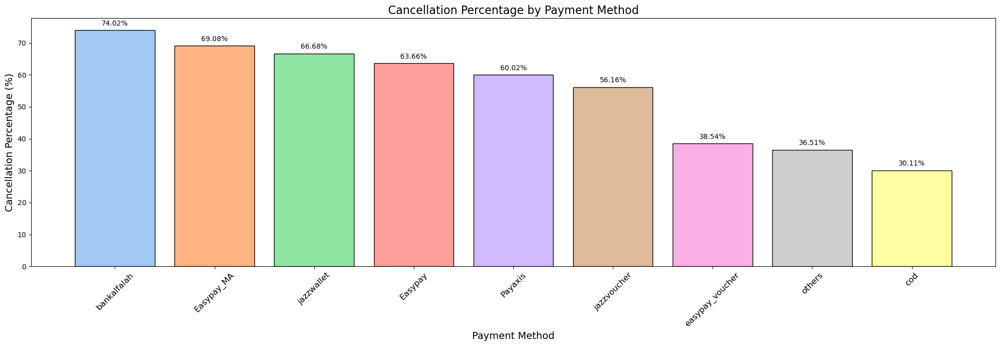

In [215]:
plt.figure(figsize=(20, 7))
bars = plt.bar(sort_by_cancellation_pct['payment_method'], 
               sort_by_cancellation_pct['percentage_of_cancellation'], 
               color=sns.color_palette("pastel", len(sort_by_cancellation_pct)), 
               edgecolor='black')
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 1,  
             f'{height:.2f}%',  
             ha='center', va='bottom', fontsize=10)
plt.title('Cancellation Percentage by Payment Method', fontsize=16)
plt.xlabel('Payment Method', fontsize=14)
plt.ylabel('Cancellation Percentage (%)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()
plt.show()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 2.1 📊 Cancellation and Completion Percentages by Payment Method </h4>


In [564]:
# I mean sort by total %
sort_by_cancellation_pct = method_counts.sort_values(by="total", ascending=False)

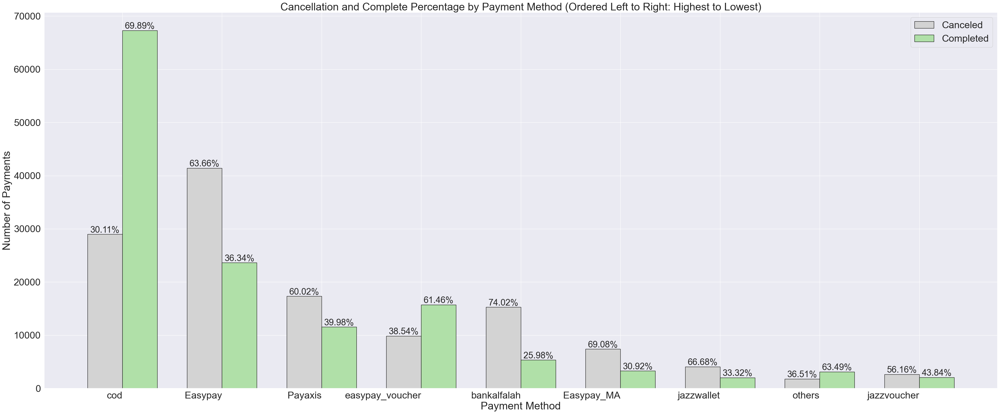

In [628]:
fig, ax = plt.subplots(figsize=(40, 17))
bar_width = 0.35
index = np.arange(len(sort_by_cancellation_pct))
bar1 = ax.bar(index, sort_by_cancellation_pct['canceled'], bar_width, label='Canceled', color='#D3D3D3', linewidth=1, edgecolor='black')
bar2 = ax.bar(index + bar_width, sort_by_cancellation_pct['complete'], bar_width, label='Completed', color='#B0E0A8', linewidth=1, edgecolor='black')
for i, rect in enumerate(bar1):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height, f'{sort_by_cancellation_pct["percentage_of_cancellation"].iloc[i]:.2f}%', 
            ha='center', va='bottom', fontsize=25)
for i, rect in enumerate(bar2):
    height = rect.get_height()
    percentage_of_completion = (sort_by_cancellation_pct["complete"].iloc[i] / sort_by_cancellation_pct["total"].iloc[i]) * 100
    ax.text(rect.get_x() + rect.get_width() / 2, height, f'{percentage_of_completion:.2f}%', 
            ha='center', va='bottom', fontsize=25)
ax.set_xlabel('Payment Method')
ax.set_ylabel('Number of Payments')
ax.set_title('Cancellation and Complete Percentage by Payment Method (Ordered Left to Right: Highest to Lowest)')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(sort_by_cancellation_pct['payment_method'], rotation=0, ha='right')
ax.legend()
plt.tight_layout()
plt.show()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 3.1 📊 Percentage of Total Transactions by Payment Method </h4>


In [674]:
total_transactions = method_counts.sort_values(by="total", ascending=False)

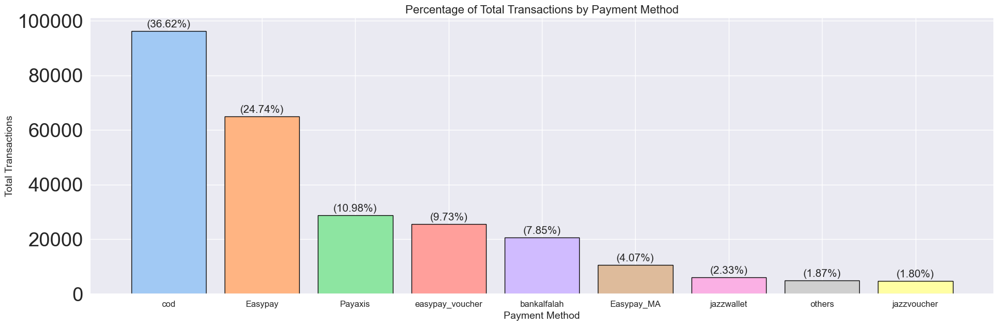

In [676]:
total_transactions = sort_by_total_pct['total'].sum()
plt.figure(figsize=(20, 7))
bars = plt.bar(sort_by_total_pct['payment_method'], 
               sort_by_total_pct['total'], 
               color=sns.color_palette("pastel", len(sort_by_total_pct)), 
               edgecolor='black')
for bar in bars:
    height = bar.get_height()
    percentage = (height / total_transactions) * 100
    plt.text(bar.get_x() + bar.get_width() / 2, height + 500, 
             f'({percentage:.2f}%)', 
             ha='center', va='bottom', fontsize=15)
plt.title('Percentage of Total Transactions by Payment Method', fontsize=16)
plt.xlabel('Payment Method', fontsize=14)
plt.ylabel('Total Transactions', fontsize=14)
plt.xticks(rotation=0, fontsize=12)
plt.tight_layout()
plt.show()

 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">- Modifying Age to Categories: Young Adults, Adults, Seniors </h2>


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Age Categorization Function </h3>


In [223]:
# Age Categorization Function
def categorize_age(age):
    if 18 <= age <= 29:
        return 'young_adults'
    elif 30 <= age <= 59:
        return 'adults'
    elif age >= 60:
        return 'seniors'

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Age Categorization Applied to Group Customers </h3>


In [226]:
df["age"].describe().T

count   262967.00
mean        46.54
std         16.66
min         18.00
25%         32.00
50%         47.00
75%         61.00
max         75.00
Name: age, dtype: float64

In [228]:
# Categorizing age into groups (young adults, adults, seniors) to help group customers and identify patterns.

df["age_category"] = df["age"].apply(categorize_age)

In [230]:
#Using function to move age column

df = move_column(df,"age_category", 18)

 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">Numerical Feature Analysis</h2>


In [632]:
df_num_all = df.copy()

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Modifying Gender & Status</h3>


In [635]:
# "status"  0 = complete   1 = canceled

df_num_all["status"] = df_num_all["status"].map({"complete":0, "canceled":1})

In [637]:
# "gender" column changed to 0 = F and 1 = M.

df_num_all["gender"] = df_num_all["gender"].replace({"F":0, "M": 1})

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Select Numeric Columns</h3>


In [640]:
num_all = df_num_all.select_dtypes("number")

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊📈📉Descriptive Statistics  </h3>


In [116]:
round(num_all.describe().T, 2)

,count,mean,std,min,25%,50%,75%,max
ref_num,262967.00,560462.78,255959.51,111127.00,340630.00,564113.00,780968.50,999981.00
price,262967.00,751.39,1628.64,1.00,49.90,105.00,684.00,101262.59
discount_percent,262967.00,6.12,10.46,0.00,0.00,0.00,12.30,75.00
num_orders,262967.00,3.12,3.91,2.00,2.00,2.00,3.00,371.00
value,262967.00,961.99,2143.59,1.00,69.80,199.80,1054.10,101262.59
discount_amount,262967.00,76.16,266.97,0.00,0.00,0.00,31.96,30213.15
total,262967.00,885.83,2052.06,1.00,64.90,185.12,974.70,101262.59
cust_id,262967.00,70036.66,30138.79,4.00,56516.00,74222.00,92307.50,115323.00
age,262967.00,46.54,16.66,18.00,32.00,47.00,61.00,75.00
status_0_complete_1_cancelled,262967.00,0.49,0.50,0.00,0.00,0.00,1.00,1.00


 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊📈📉 Checking Distributions.  Histogram </h3>

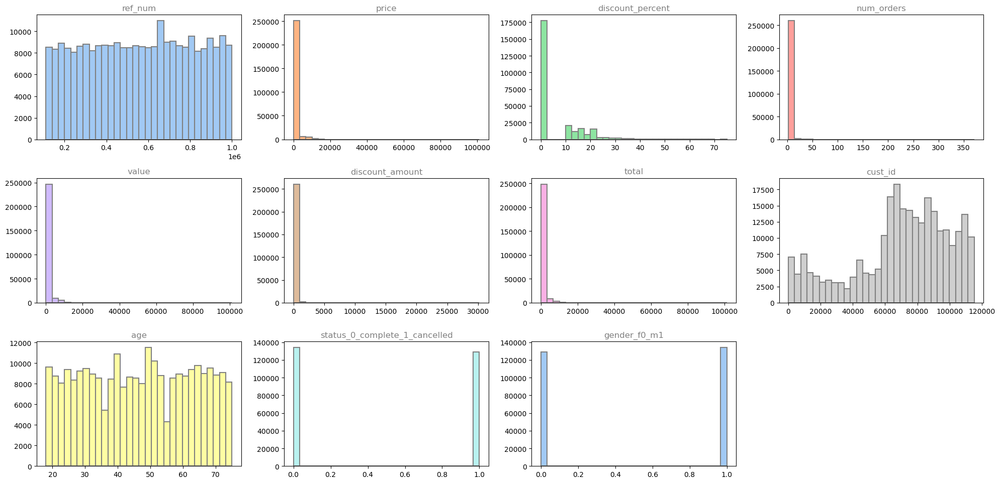

In [118]:
custom_palette = sns.color_palette("pastel", 10)
nrows, ncols = 5, 4
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 16))
axes = axes.flatten()
for i, ax in enumerate(axes):
    if i >= len(num_all.columns):
        ax.set_visible(False)
        continue
    ax.hist(num_all.iloc[:, i], bins=30, color=custom_palette[i % 10], edgecolor='gray', linewidth=1.5, linestyle='-')
    ax.set_title(num_all.columns[i], color='gray')
plt.tight_layout()
plt.show()

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊📈📉 Checking Distributions.  boxplots</h3>



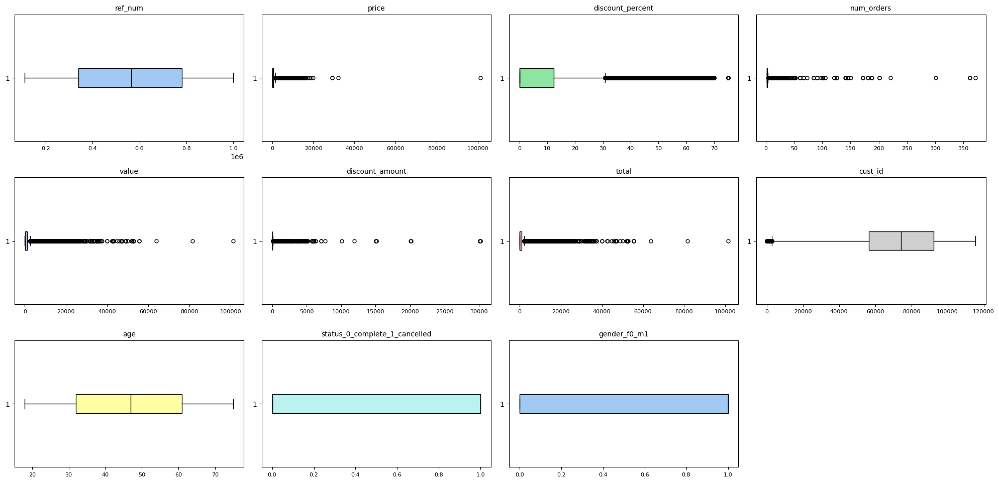

In [97]:
pastel_palette = sns.color_palette("pastel", 10)  
nrows, ncols = 5, 4
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 16))
axes = axes.flatten()
for i, ax in enumerate(axes):
  if i >= len(num_all.columns):
    ax.set_visible(False)
    continue
  current_color = pastel_palette[i % len(pastel_palette)]
  ax.boxplot(num_all.iloc[:, i].dropna(), vert=False, patch_artist=True,
             boxprops=dict(facecolor=current_color, color='black'),
             medianprops=dict(color='black'),  
             whiskerprops=dict(color='black'),
             capprops=dict(color='black'),
             flierprops=dict(marker='o', color='red', markersize=5))
  ax.set_title(num_all.columns[i], fontsize=10)
  ax.tick_params(axis='x', labelsize=8)
plt.tight_layout()
plt.show()

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊📈📉 Multicollinearity</h3>



In [1286]:
# correlation matrix with Pearson (linearity) to help analyse through visualization
correlation_matrix_all = round(num_all.corr(), 2)

In [1288]:
#correlation_matrix_all

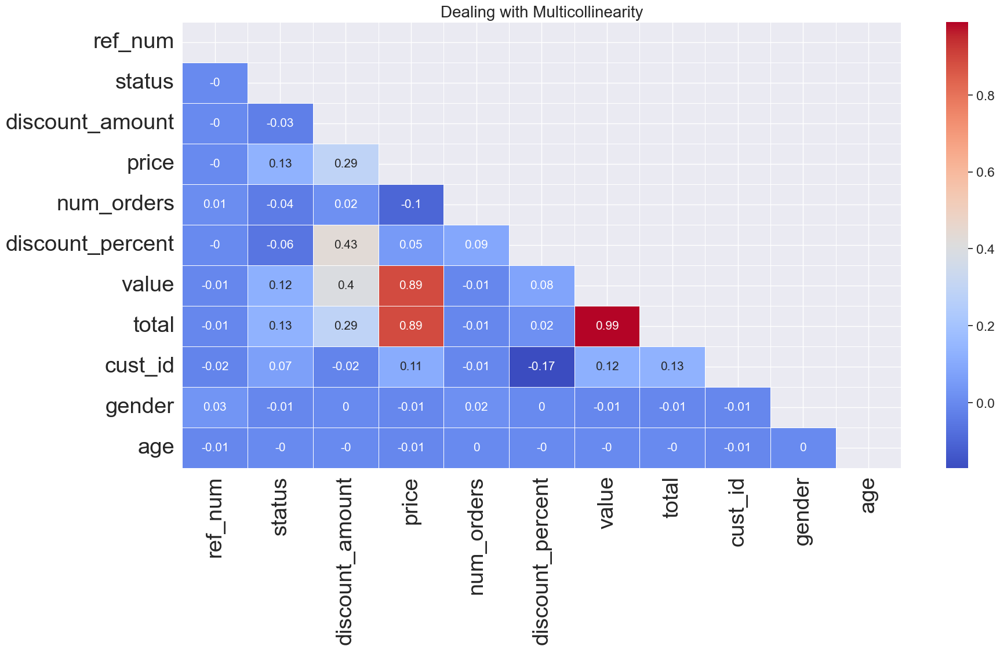

In [1290]:
mask = np.zeros_like(correlation_matrix_all)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(20, 10))
sns.set(font_scale=1.5)
ax = sns.heatmap(correlation_matrix_all, mask=mask, annot=True, annot_kws={"size": 15}, linewidths=.5, cmap="coolwarm")
ax.set_title("Dealing with Multicollinearity", fontsize=20)
plt.show()

 <h2 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">Categorical Feature Analysis </h2>


In [458]:
df_cat_all = df.copy()

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Select Categorical Columns</h3>


In [461]:
cat_all = df.select_dtypes(include=["object", "category"])

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Modifying Gender & Status</h3>


In [464]:
# "status"  0 = complete   1 = canceled

cat_all["status_0_complete_1_cancelled"] = cat_all["status"].map({"complete":0, "canceled":1})

In [466]:
# "gender" column changed to 0 = F and 1 = M.

cat_all["gender_f0_m1"] = cat_all["gender"].replace({"F":0, "M": 1})

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Analyzing Status & Gender</h3>


In [1303]:
cat_all_t1 = cat_all.copy()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Significance Testing (p-value) for Categorical Variables</h4>


In [120]:
contingency_table_cat_t1 = pd.crosstab(cat_all_t1["gender_f0_m1"], cat_all_t1["status_0_complete_1_cancelled"])

In [122]:
chi2_cat, chi2_pvalue_cat, _, _  = chi2_contingency(contingency_table_cat_t1)

In [124]:
 chi2_pvalue_cat

0.0024296300453924584

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Cramér's V for Categorical Variables</h4>


In [175]:
contingency_table_cat_cramer_t1 = pd.crosstab(cat_all_t1["gender_f0_m1"], cat_all_t1["status_0_complete_1_cancelled"])

In [177]:
# measures the strength of association, close to 0 indicating weak or no association, values between 0.2 and 0.4 suggesting moderate association, and values above 0.4 indicating strong association.

association(contingency_table_cat_cramer_t1, method='cramer')

0.004135492607384833

In [1784]:
## 0.004135 **weak** association between two variables.

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊 Visualizations (Distribution of Purchases by Gender )</h4>


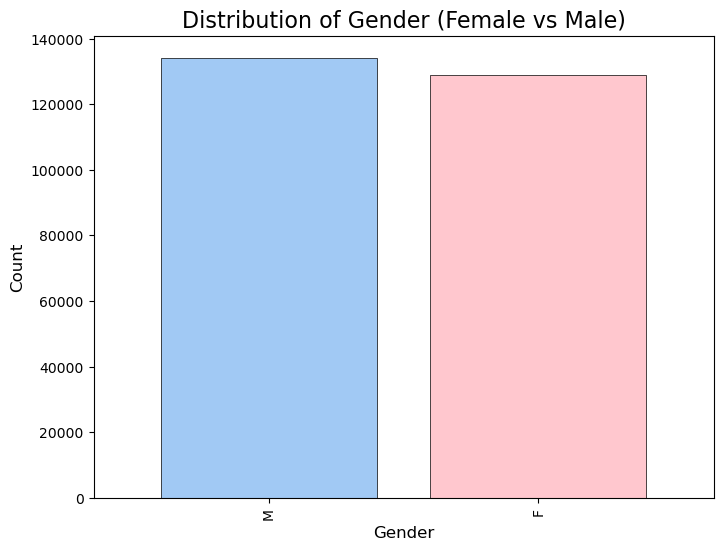

In [788]:
import matplotlib.pyplot as plt

gender_counts = cat_all_t1["gender"].value_counts()
gender_labels = {0: 'Female', 1: 'Male'}
gender_counts = gender_counts.rename(gender_labels)
plt.figure(figsize=(8, 6))
gender_counts.plot(kind='bar', color=['#A1C9F4', '#FFC7CE'], width=0.8, edgecolor='black', linewidth=0.5)
plt.title('Distribution of Gender (Female vs Male)', fontsize=16)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

In [790]:
df["gender"].value_counts()

gender
M    134176
F    128791
Name: count, dtype: int64

<h4 style="color: #BDC3C7;">Interpretation ✍️</h4>

While the **p-value** suggests a statistical **relationship** (0.0338),the **relationship** between status and gender, while statistically significant, has a **minimal effect** size as measured by **Cramer's V** (0.0041354). To gain a better understanding, it's advisable to analyze additional variables like ["age"] or ["name_prefix].


The **bar chart** shows a slight **difference** in the distribution by gender, **but** the **statistical** analysis indicates that this **difference is not significant**.

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Analyzing Status & name_prefix </h3>


In [801]:
cat_all_t2 = cat_all.copy()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Explore ["name_prefix"]</h4>


In [804]:
cat_all_t2["name_prefix"].value_counts()

name_prefix
Mr.      94897
Ms.      55203
Mrs.     43481
Hon.     28000
Drs.     14935
Prof.    13729
Dr.      12722
Name: count, dtype: int64

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Significance Testing (p-value) for Categorical Variables</h4>


In [807]:
contingency_table_cat_t2 = pd.crosstab(cat_all_t2["name_prefix"], cat_all_t2["status"])

In [809]:
chi2_cat_t2,  pvalue_cat_t2 , _, _  = chi2_contingency(contingency_table_cat_t2)

In [811]:
pvalue_cat_t2

9.226312026812199e-13

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Cramér's V for Categorical Variables</h4>


In [814]:
contingency_table_cat_t2 = pd.crosstab(cat_all_t2["name_prefix"], cat_all_t2["status"])

In [816]:
# measures the strength of association, close to 0 indicating weak or no association, values between 0.2 and 0.4 suggesting moderate association, and values above 0.4 indicating strong association.

association(contingency_table_cat_t2, method='cramer')

0.016113203617572104

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊 Visualizations (Distribution by Name Prefix)</h4>


In [819]:
contingency_table_cat_vi_t2 = pd.crosstab(cat_all_t2["name_prefix"], cat_all_t2["status"])

<Figure size 2500x500 with 0 Axes>

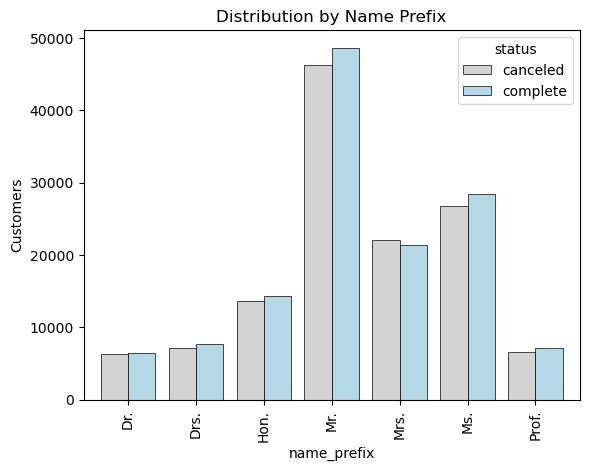

In [821]:
 plt.figure(figsize=(25, 5))  
green_pastel_t3 = '#D3D3D3'  
red_pastel_t3 = '#B3D9E6'  
contingency_table_cat_vi_t2.plot(
    kind='bar', 
    width=0.8, 
    color=[green_pastel_t3, red_pastel_t3],
    edgecolor='black', 
    linewidth=0.5       
)
plt.title('Distribution by Name Prefix')
plt.xlabel('name_prefix')
plt.ylabel('Customers')
plt.show()

In [256]:
contingency_table_cat_vi_t2

status,canceled,complete
name_prefix,,
Dr.,6322,6451
Drs.,7224,7740
Hon.,13717,14323
Mr.,46850,48761
Mrs.,22138,21450
Ms.,26907,28450
Prof.,6722,7125


In [243]:
cat_all_t2["name_prefix"].value_counts() 

name_prefix
Mr.      95611
Ms.      55357
Mrs.     43588
Hon.     28040
Drs.     14964
Prof.    13847
Dr.      12773
Name: count, dtype: int64

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">-  Analyzing Status & Category  </h3>


In [683]:
cat_all_t3 = cat_all.copy()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Explore ["category"]</h4>


In [686]:
cat_all_t3["category"].value_counts()

category
Mobiles & Tablets     54496
Men's Fashion         39094
Appliances            28506
Women's Fashion       27253
Others                24644
Beauty & Grooming     17065
Superstore            14404
Entertainment         14207
Home & Living         13185
Health & Sports        8222
Computing              7205
Soghaat                7070
Kids & Baby            6227
School & Education     1062
Books                   327
Name: count, dtype: int64

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Cancellation and Complete Rates  </h4>


In [689]:
#calculating the count for each combination
status_category_count_t3 = cat_all_t3.groupby(["category", "status"]).size().unstack(fill_value=0)

#complete and canceled 
status_category_count_t3["total"] = status_category_count_t3.sum(axis=1)

# percentage
status_category_count_t3["complete_percent"] = (status_category_count_t3["complete"] / status_category_count_t3["total"]) * 100

# cancellation percentage for each category
status_category_count_t3["canceled_percent"] = (status_category_count_t3["canceled"] / status_category_count_t3["total"]) * 100

#dataFrame  
status_category_count_sorted_t3 = status_category_count_t3[["complete_percent", "canceled_percent"]].copy()

#difference  
status_category_count_sorted_t3["difference_total"] = status_category_count_sorted_t3["complete_percent"] - status_category_count_sorted_t3["canceled_percent"]


# sorted by diferrence_total
status_category_count_sorted_t3 = status_category_count_sorted_t3.sort_values(by="difference_total", ascending=True)

In [691]:
status_category_count_sorted_t3

status,complete_percent,canceled_percent,difference_total
category,,,
Others,29.99,70.01,-40.03
Mobiles & Tablets,43.96,56.04,-12.08
Computing,45.55,54.45,-8.90
Entertainment,50.64,49.36,1.27
School & Education,51.41,48.59,2.82
Books,51.99,48.01,3.98
Appliances,52.19,47.81,4.39
Men's Fashion,54.23,45.77,8.47
Women's Fashion,55.99,44.01,11.97


 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Calculate the total percentage of canceled products for each category </h4>


In [695]:
#calcluate counts 
status_counts_t3_ts1_t3 = cat_all_t3.groupby(["category", "status"]).size().unstack(fill_value=0)

# completed counts, canceled counts, and cancel percentage
status_counts_t3_ts1_t3["total_count"] = status_counts_t3_ts1_t3.sum(axis=1)
status_counts_t3_ts1_t3["cancel_percentage"] = (status_counts_t3_ts1_t3["canceled"] / status_counts_t3_ts1_t3["total_count"]) * 100

# sorted
output_df_cat_t3_ts1_t3 = status_counts_t3_ts1_t3[["total_count", "complete", "canceled", "cancel_percentage"]].sort_values(by="cancel_percentage", ascending=False)

#reset index
output_df_cat_t3_ts1_t3.reset_index(inplace=True)


In [697]:
output_df_cat_t3_ts1_t3

status,category,total_count,complete,canceled,cancel_percentage
0,Others,24644,7390,17254,70.01
1,Mobiles & Tablets,54496,23957,30539,56.04
2,Computing,7205,3282,3923,54.45
3,Entertainment,14207,7194,7013,49.36
4,School & Education,1062,546,516,48.59
5,Books,327,170,157,48.01
6,Appliances,28506,14878,13628,47.81
7,Men's Fashion,39094,21202,17892,45.77
8,Women's Fashion,27253,15258,11995,44.01
9,Kids & Baby,6227,3530,2697,43.31


 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊 Visualizations (Calculate the total percentage of canceled products for each category) </h4>


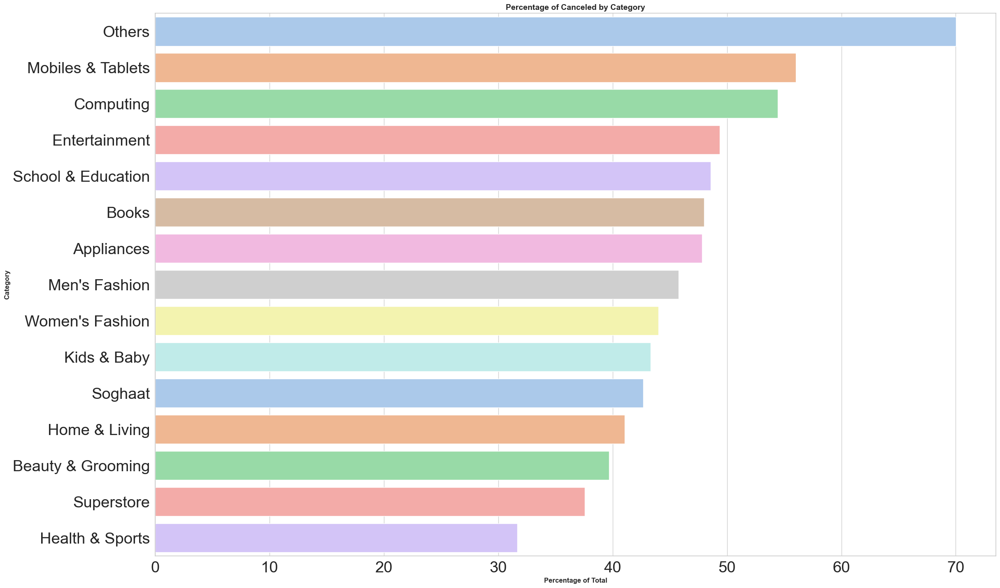

In [715]:
output_df_cat_t3_ts1_t3_sort = output_df_cat_t3_ts1_t3[['category', 'cancel_percentage']].sort_values(by='cancel_percentage', ascending=False)
sns.set_style("whitegrid")
plt.figure(figsize=(25, 15))
sns.barplot(x='cancel_percentage', y='category', data=output_df_cat_t3_ts1_t3_sort, palette='pastel')
plt.xlabel('Percentage of Total', fontsize=12, fontweight='bold')
plt.ylabel('Category', fontsize=12, fontweight='bold')
plt.title('Percentage of Canceled by Category', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊 Visualizations (Completed and Canceled Products per Category) </h4>


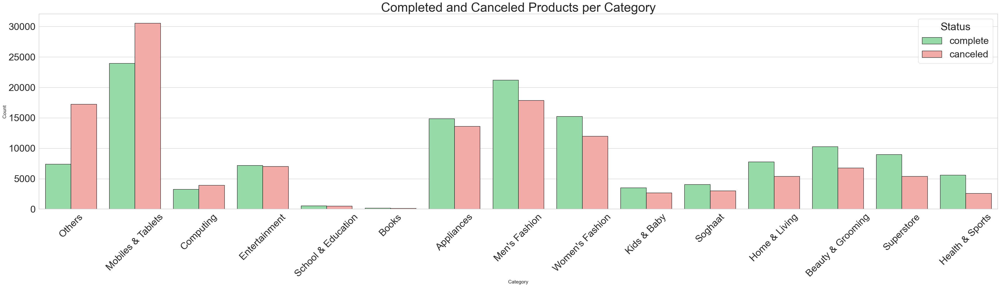

In [755]:
completed_cancelled_per_category_t3 = output_df_cat_t3_ts1_t3.melt(
    id_vars='category', value_vars=['complete', 'canceled'],
    var_name='status', value_name='count'
)
green_pastel_t3 = '#8DE5A1'
red_pastel_t3 = '#FF9F9B'
palette = [green_pastel_t3, red_pastel_t3]
plt.figure(figsize=(40, 12))
sns.barplot(
    x='category', y='count', hue='status', data=completed_cancelled_per_category_t3, palette=palette,
    edgecolor='black' 
)
plt.title('Completed and Canceled Products per Category', fontsize=36)
plt.xlabel('Category', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Status', loc='upper right')
plt.tight_layout()
plt.show()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊 Visualizations (Total Products Purchased by Category) </h4>


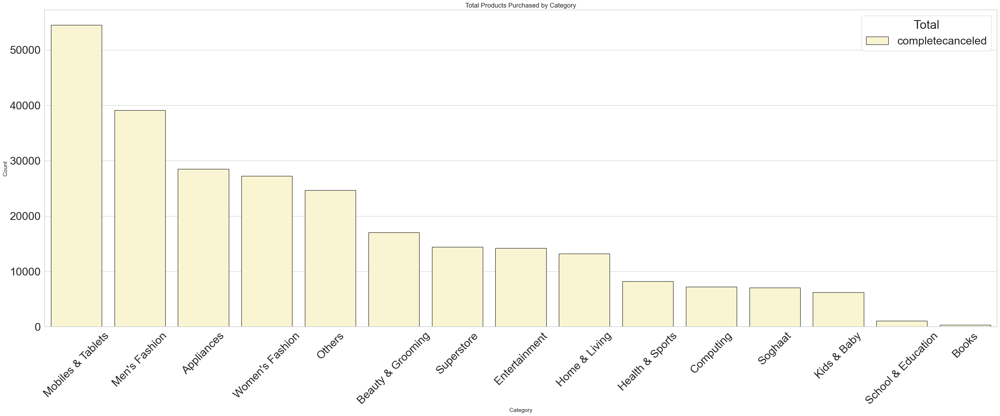

In [769]:
completed_cancelled_per_category_t3 = output_df_cat_t3_ts1_t3.melt(
    id_vars='category', value_vars=['complete', 'canceled'],
    var_name='status', value_name='count'
)
completed_cancelled_per_category_t3 = completed_cancelled_per_category_t3.groupby('category').sum().reset_index()
completed_cancelled_per_category_t3 = completed_cancelled_per_category_t3.sort_values('count', ascending=False)
green_pastel_t3 = '#FFFACD'
red_pastel_t3 = '#B3D9E6'
palette = [green_pastel_t3, red_pastel_t3]
plt.figure(figsize=(35, 15))
sns.barplot(
    x='category', y='count', hue='status', data=completed_cancelled_per_category_t3, palette=palette,
    edgecolor='black', linewidth=1  
)
plt.title('Total Products Purchased by Category', fontsize=16)
plt.xlabel('Category', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Total', loc='upper right')
plt.tight_layout()
plt.show()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 📊 Visualizations (Median Price by Category) </h4>


In [899]:
median_by_category = df.groupby('category')['price'].median()


In [901]:
median_by_category = median_by_category.reset_index()

In [903]:
median_by_category_sorted = median_by_category.sort_values(by='price', ascending=False)
median_by_category_sorted

,category,price
4,Entertainment,1895.80
9,Mobiles & Tablets,1387.90
0,Appliances,499.90
3,Computing,399.90
14,Women's Fashion,119.90
10,Others,100.00
8,Men's Fashion,69.90
2,Books,48.00
7,Kids & Baby,40.90
1,Beauty & Grooming,40.00


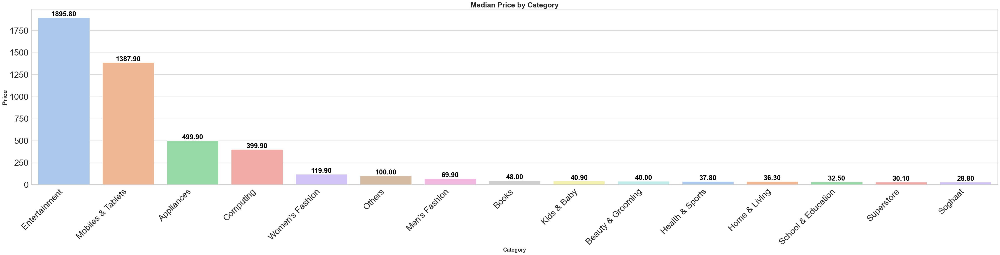

In [896]:
sns.set_style("whitegrid")
plt.figure(figsize=(45, 12))
ax = sns.barplot(x='category', y='price', data=median_by_category_sorted, palette='pastel')
plt.xlabel('Category', fontsize=17, fontweight='bold')
plt.ylabel('Price', fontsize=20, fontweight='bold')
plt.title('Median Price by Category', fontsize=23, fontweight='bold')
plt.xticks(rotation=45, ha='right')
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', fontsize=22, fontweight='bold', color='black', xytext=(0, 10), textcoords='offset points')
plt.tight_layout()
plt.show()

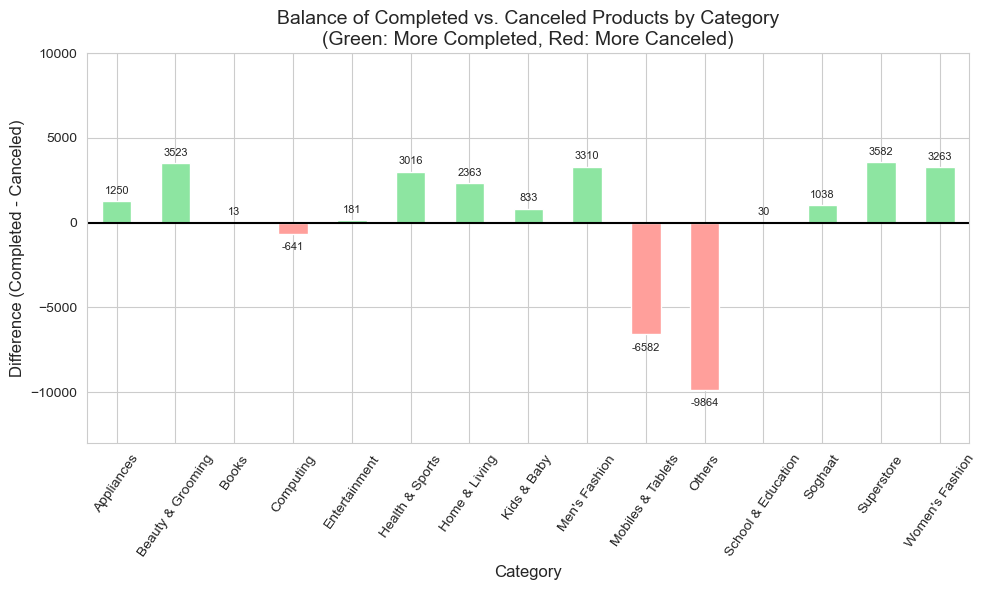

In [874]:
status_category_count_t3 = cat_all.groupby(['category', 'status']).size().unstack(fill_value=0)
if 'complete' in status_category_count_t3.columns and 'canceled' in status_category_count_t3.columns:
    status_category_count_t3['difference'] = status_category_count_t3['complete'] - status_category_count_t3['canceled']
else:
    raise ValueError("Columns 'complete' or 'canceled' are missing in the data.")
green_pastel_t3 = '#8DE5A1'
red_pastel_t3 = '#FF9F9B'
colors_t3 = [green_pastel_t3 if x > 0 else red_pastel_t3 for x in status_category_count_t3['difference']]
plt.figure(figsize=(10, 6))
status_category_count_t3['difference'].plot(kind='bar', color=colors_t3)
plt.title('Balance of Completed vs. Canceled Products by Category\n(Green: More Completed, Red: More Canceled)', fontsize=14)
plt.xlabel('Category', fontsize=12)
plt.ylabel('Difference (Completed - Canceled)', fontsize=12)
plt.xticks(rotation=55, fontsize=10)
plt.ylim(-13000, 10000)
plt.axhline(y=0, color='black', linestyle='-')
for i, v in enumerate(status_category_count_t3['difference']):
    if v < 0:
        plt.text(i, v - 500, str(v), ha='center', va='top', fontsize=8)
    else:
        plt.text(i, v + 300, str(v), ha='center', va='bottom', fontsize=8)
plt.tight_layout()
plt.show()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Significance Testing (p-value) for Categorical Variables</h4>


In [318]:
contingency_table_cat_t3 = pd.crosstab(cat_all_t3["status"], cat_all_t3["category"])

In [320]:
chi2_cat_t3,  pvalue_cat_t3, _, _  = chi2_contingency(contingency_table_cat_t3)

In [322]:
pvalue_cat_t3

0.0

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Cramér's V for Categorical Variables</h4>


In [324]:
# measures the strength of association, close to 0 indicating weak or no association, values between 0.2 and 0.4 suggesting moderate association, and values above 0.4 indicating strong association.

association(contingency_table_cat_t3, method='cramer')

0.18755886282650525

 <h3 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">-  Analyzing Status & Sku  </h3>


In [977]:
cat_all_t4 = cat_all.copy()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> Explore ["sku"]</h4>


In [361]:
cat_all_t4.sample(2)

,order_id,status,sku,category,payment_method,name_prefix,gender,place_name,state,user_name
147770,100421604,complete,MEFESS59F1D8A2D8A25-M,Men's Fashion,cod,Drs.,F,East Waterford,ME,bhkillinger
152201,100425336,complete,ENTECO5A18229ADB799,Entertainment,easypay_voucher,Mrs.,F,Seagoville,TX,brgordillo


In [362]:
cat_all_t4["sku"].value_counts()

sku
MATSAM59DB75ADB2F80      3493
MATSAM5A7463EE3C1A5      1112
APPNAT5A0A01860CE92      1097
MATTEL5A462528E403F       929
VIT5ABCCF7FDF973          858
                         ... 
HALDYN5A002999097B3         1
HALSIN59F333623E000         1
APPWES59D4916E77560         1
WOFTOO59D51636B7604         1
MEFMOV5AD9155B0C0DC-M       1
Name: count, Length: 46470, dtype: int64

In [365]:
cat_all_t4.sample(2)

,order_id,status,sku,category,payment_method,name_prefix,gender,place_name,state,user_name
167460,100546508,complete,HASQAR5A536933D5093,Health & Sports,bankalfalah,Ms.,F,Monument,NM,mkcalles
188110,100541317,canceled,MEFAYB5AEAE484C6049-Free Size,Men's Fashion,Easypay,Mrs.,F,Kittanning,PA,exbailes


In [366]:
cat_all_t4["category"].value_counts()

category
Mobiles & Tablets     54512
Men's Fashion         39098
Appliances            28520
Women's Fashion       27255
Others                25672
Beauty & Grooming     17105
Superstore            14405
Entertainment         14207
Home & Living         13260
Health & Sports        8255
Computing              7205
Soghaat                7070
Kids & Baby            6227
School & Education     1062
Books                   327
Name: count, dtype: int64

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Significance Testing (p-value) for Categorical Variables</h4>


In [331]:
contingency_table_cat_t4 = pd.crosstab(cat_all_t4["status"], cat_all_t4["sku"])

In [332]:
chi2_cat_t4,  pvalue_cat_t4, _, _  = chi2_contingency(contingency_table_cat_t4)

In [333]:
pvalue_cat_t4

0.0

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;">- Cramér's V for Categorical Variables</h4>


In [337]:
# measures the strength of association, close to 0 indicating weak or no association, values between 0.2 and 0.4 suggesting moderate association, and values above 0.4 indicating strong association.

association(contingency_table_cat_t4, method='cramer')

0.5543143453302188

 <h3 style="color: #7f8c8d; font-family: 'Arial', sans-serif;"> 🧮 Visualizations important categorical data</h3>


 <h4 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">  📊 Visualizations (Cancellation Percentage by Region)</h4>


In [1162]:
#reigion percentage


region_total = cat_all["region"].value_counts()

status_counts = cat_all.groupby("region")["status"].value_counts().unstack(fill_value=0)

In [1164]:
status_counts["total"] = region_total

status_counts["canceled_percentage"] = (status_counts["canceled"] / status_counts["total"]) * 100

status_counts["complete_percentage"] = (status_counts["complete"] / status_counts["total"]) * 100

In [1166]:
status_counts = status_counts[["total", "complete", "canceled", "canceled_percentage", "complete_percentage"]]

In [1168]:
#soerted
status_counts = status_counts.sort_values(by="complete_percentage", ascending=True)


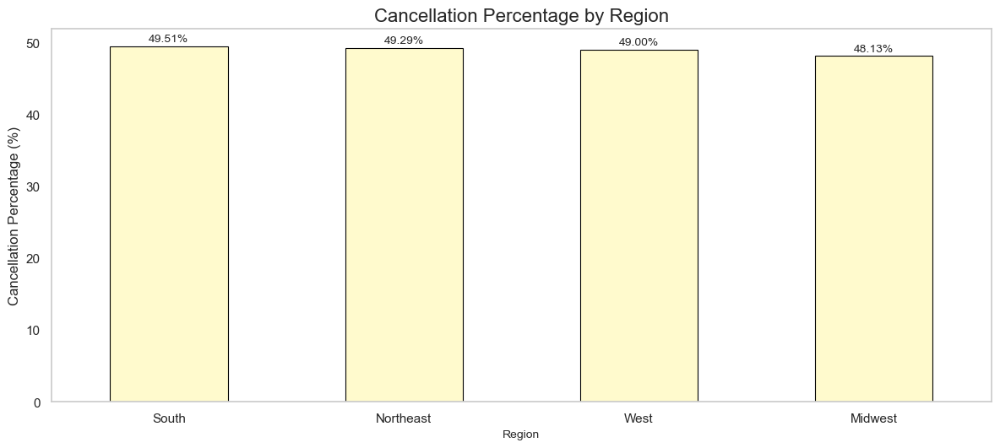

In [1170]:
plt.figure(figsize=(12, 6))
status_counts["canceled_percentage"].plot(kind="bar", color="#FFFACD", edgecolor="black", linewidth=0.8)
plt.title("Cancellation Percentage by Region", fontsize=16)
plt.xlabel("Region", fontsize=10)
plt.ylabel("Cancellation Percentage (%)", fontsize=12)
for idx, value in enumerate(status_counts["canceled_percentage"]):
    plt.text(idx, value + 0.3, f"{value:.2f}%", ha="center", va="bottom", fontsize=10)
plt.grid(False)
plt.tight_layout()
plt.xticks(rotation=0)
plt.show()

 <h4 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">  📊 Visualizations (Cancellation Percentage by Gender)</h4>


In [1223]:
status_counts_2 = cat_all.groupby("gender")["status"].value_counts().unstack(fill_value=0)
 

In [1225]:

status_counts_2["total_2"] = status_counts_2.sum(axis=1)

status_counts_2["canceled_percentage_2"] = (status_counts_2["canceled"] / status_counts_2["total_2"]) * 100

In [1227]:
status_counts_2.reset_index()

status,gender,canceled,complete,total_2,canceled_percentage_2
0,F,63483,65308,128791,49.29
1,M,65343,68833,134176,48.70


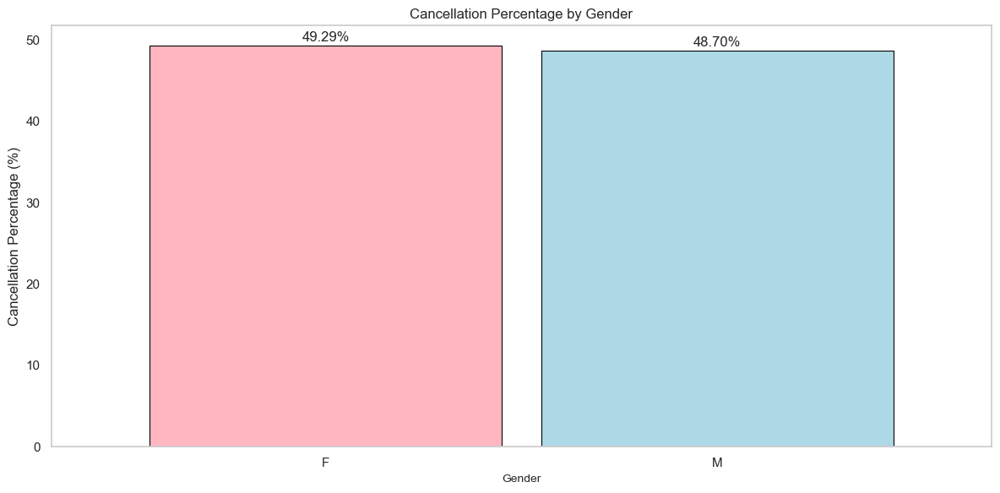

In [1230]:
gender_colors = ['#FFB6C1', '#ADD8E6']  
plt.figure(figsize=(12, 6))
status_counts_2["canceled_percentage_2"].plot(kind="bar", color=gender_colors, edgecolor="black", linewidth=0.8, width=0.9)
plt.title("Cancellation Percentage by Gender", fontsize=12)
plt.xlabel("Gender", fontsize=10)
plt.ylabel("Cancellation Percentage (%)", fontsize=12)
for idx, value in enumerate(status_counts_2["canceled_percentage_2"]):
    plt.text(idx, value + 0.2, f"{value:.2f}%", ha="center", va="bottom", fontsize=12)
plt.xticks(rotation=0)
plt.grid(False)
plt.tight_layout()
plt.show()

 <h4 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">  📊 Visualizations (Cancellation Percentage by Gender)</h4>


In [1232]:
df.sample(2)

,order_id,ref_num,status,sku,discount_amount,order_date,price,num_orders,discount_percent,value,total,category,payment_method,cust_id,name_prefix,gender,age,sign_in_date,age_category,place_name,state,region,user_name,product_premium_status,premium_category
236057,100503148,922244,canceled,OTHPCB5ABB2078993B7,0.00,2021-04-30,100.00,3,0.00,300.00,300.00,Others,bankalfalah,101304,Dr.,M,30,1995-02-01,adults,Monroe,NC,South,bjhillhouse,no,no
111277,100396996,199381,canceled,APPNAT59F6C736DB370,0.00,2020-12-22,86.80,1,0.00,86.80,86.80,Appliances,cod,71803,Dr.,M,45,2015-11-16,adults,Cowansville,PA,Northeast,tcfrazee,no,no


In [ ]:
status_counts_3 = cat_all.groupby("age_category")["status"].value_counts().unstack(fill_value=0)
status_counts_3["total_3"] = status_counts_3.sum(axis=1)
 

In [1254]:
status_counts_3["canceled_percentage_3"] = (status_counts_3["canceled"] / status_counts_3["total_3"]) * 100

In [1256]:
status_counts_3

status,canceled,complete,total_3,canceled_percentage_3
age_category,,,,
adults,66381,70569,136950,48.47
seniors,35750,36820,72570,49.26
young_adults,26695,26752,53447,49.95


In [1263]:
status_counts_3 = status_counts_3.sort_values(by="canceled_percentage_3", ascending=False)


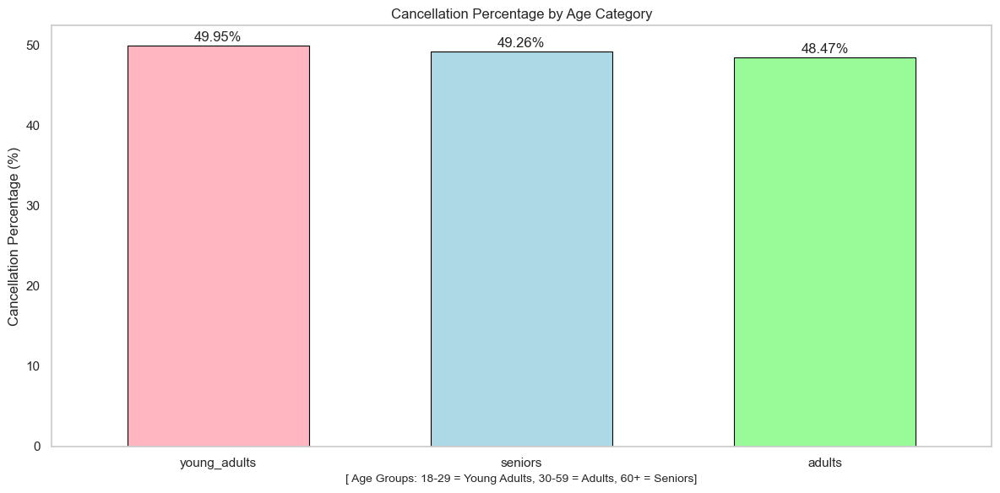

In [1278]:
age_category_colors = ['#FFB6C1', '#ADD8E6', '#98FB98', '#FFD700']  #
plt.figure(figsize=(12, 6))
status_counts_3["canceled_percentage_3"].plot(kind="bar", color=age_category_colors, edgecolor="black", linewidth=0.8, width=0.6)
plt.title("Cancellation Percentage by Age Category", fontsize=12)
plt.xlabel("[ Age Groups: 18-29 = Young Adults, 30-59 = Adults, 60+ = Seniors]", fontsize=10)
plt.ylabel("Cancellation Percentage (%)", fontsize=12)
for idx, value in enumerate(status_counts_3["canceled_percentage_3"]):
    plt.text(idx, value + 0.2, f"{value:.2f}%", ha="center", va="bottom", fontsize=12)
plt.xticks(rotation=0)
plt.grid(False)
plt.tight_layout()
plt.show()

 <h4 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">  📊 Visualizations (Total Products Bought by Age Category)</h4>


In [1312]:
status_counts_by_age_category = cat_all.groupby(["age_category", "status"]).size().unstack(fill_value=0)


In [1314]:
status_counts_by_age_category["total_products"] = status_counts_by_age_category["complete"] + status_counts_by_age_category["canceled"]
status_counts_by_age_category = status_counts_by_age_category[["complete", "canceled", "total_products"]]

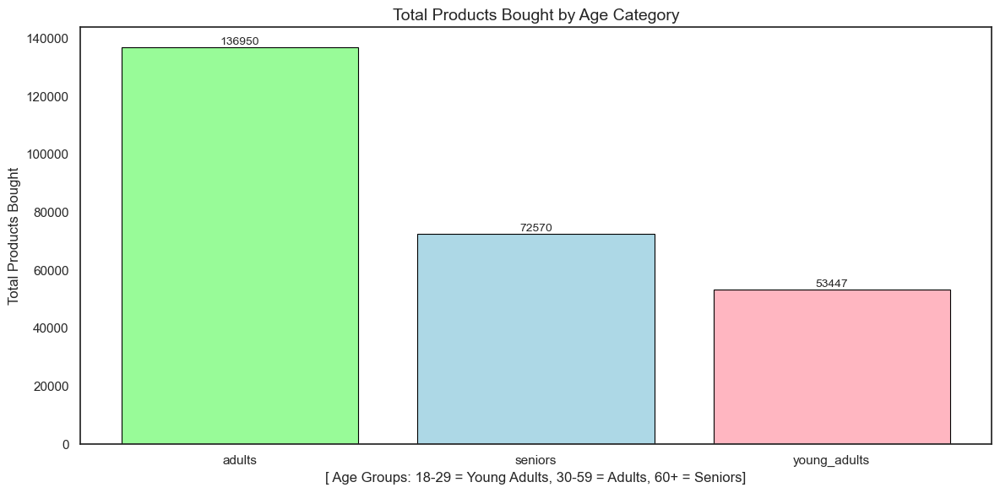

In [1325]:
pastel_colors = ['#98FB98', '#ADD8E6', '#FFB6C1']
plt.figure(figsize=(12, 6))
age_categories = status_counts_by_age_category.index
plt.bar(age_categories, status_counts_by_age_category['total_products'], color=pastel_colors[:len(age_categories)], edgecolor='black', linewidth=0.8)
plt.title('Total Products Bought by Age Category', fontsize=14)
plt.xlabel('[ Age Groups: 18-29 = Young Adults, 30-59 = Adults, 60+ = Seniors]', fontsize=12)
plt.ylabel('Total Products Bought', fontsize=12)
for idx, value in enumerate(status_counts_by_age_category['total_products']):
    plt.text(idx, value + 5, f"{value}", ha="center", va="bottom", fontsize=10)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


 <h4 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">  📊 Visualizations (Categorical Data: Canceled vs. Complete Products)</h4>


In [1007]:
test = df[df["status"] == "complete"]

In [1009]:
test["status"].value_counts()

status
complete    134141
Name: count, dtype: int64

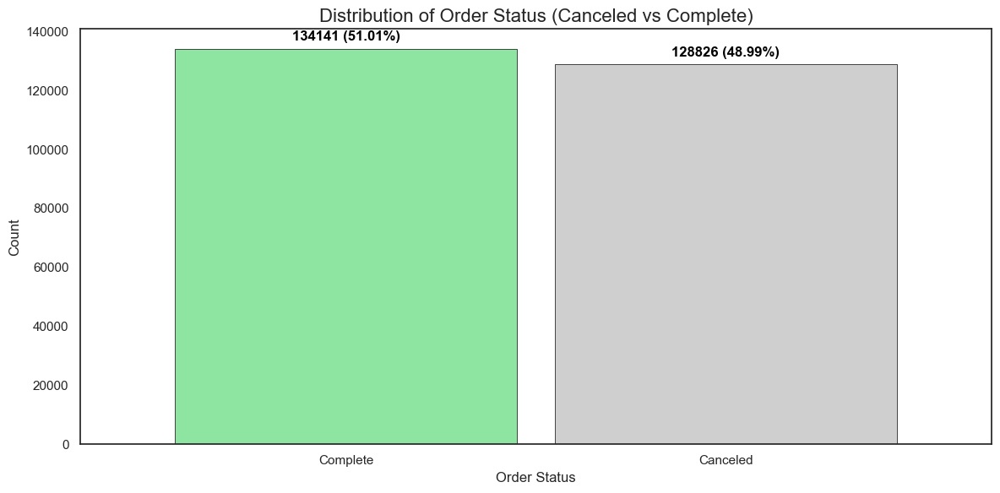

In [1319]:
status_counts = cat_all["status"].value_counts()
status_counts = status_counts.rename({"canceled": "Canceled", "complete": "Complete"})
total_count = status_counts.sum()
percentage_counts = (status_counts / total_count) * 100
sns.set_style("white")
plt.figure(figsize=(12, 6))
bars = status_counts.plot(kind='bar', color=['#8DE5A1', '#CFCFCF'], width=0.9, edgecolor='black', linewidth=0.5)
plt.title('Distribution of Order Status (Canceled vs Complete)', fontsize=16)
plt.xlabel('Order Status', fontsize=12)
plt.ylabel('Count', fontsize=12)
for i, (v, p) in enumerate(zip(status_counts, percentage_counts)):
    plt.annotate(f'{v} ({p:.2f}%)', 
                 (i, v), 
                 ha='center', 
                 fontsize=12,
                 fontweight='bold', 
                 color='black',
                 xytext=(0, 7),  
                 textcoords='offset points')
plt.grid(False)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


 <h1 style="color: #34495e     ; font-family: 'Arial', sans-serif;"> SHAP Model Analysis </h1>

 <h3 style="color: #7f8c8d; font-family: 'Arial', sans-serif;"> Categorical to Numerical Conversion for Heatmap Visualization </h3>


 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 0.1 ⚙️ Code </h4>


In [1578]:
df.sample(2)

,order_id,ref_num,status,sku,discount_amount,order_date,price,num_orders,discount_percent,value,total,category,payment_method,cust_id,name_prefix,gender,age,sign_in_date,age_category,place_name,state,region,user_name,product_premium_status,premium_category
249242,100516797,197647,complete,KABLET5A81411780BBB,0.00,2021-05-31,70.20,1,0.00,70.20,70.20,Kids & Baby,cod,105920,Hon.,M,36,2015-04-10,adults,Hartford,WI,Midwest,mxfagin,no,no
216910,100479264,711730,canceled,OTHPCB5A7D8A1168A7A,0.00,2021-04-17,100.00,5,0.00,500.00,500.00,Others,bankalfalah,94991,Ms.,F,49,2016-09-24,adults,Salt Lake City,UT,West,dflilley,no,no


In [1580]:
# coppy
df_vst_t1 = df.copy()

In [1582]:
df_vst_t1 = df_vst_t1[["discount_amount","age_category","status", "total","price", "num_orders", "discount_percent", "category", "gender", "region","payment_method","product_premium_status"]]

In [1585]:
#df_model_0["gender_f0_m1"] = df_model_0["gender"].replace({"F":0, "M": 1}) # "gender" column changed to 0 = F and 1 = M.
#df_model_0["status_complete0_cancelled1"] = df_model_0["status"].map({"complete":0, "canceled":1}) # "status"  0 = complete   1 = canceled

In [1587]:
#df_model_0.drop("gender",axis=1, inplace=True)

In [1589]:
#df_model_0.drop("status",axis=1,inplace=True)

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 1.0 📊 Visualizations (Visualization Including Categorical Data) </h4>


 <h5 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 1.1 ⚙️ Data Visualization Code </h5>


In [1593]:
# Adding 'Status' and 'Gender' Columns for Improved Results
df_vst_dummies_t1 = pd.get_dummies(df_vst_t1, columns=["age_category","status","gender","category", "region","payment_method","product_premium_status"], drop_first=False)
df_vst_dummies_t1 = df_vst_dummies_t1 * 1

In [1595]:
df_vst_dummies_t1 = df_vst_dummies_t1.select_dtypes("number")

In [1597]:
# correlation matrix with Pearson (linearity) to help analyse through visualization
corr_dummies_vst_t1 = round(df_vst_dummies_t1.corr(), 2)

In [1598]:
corr_dummies_vst_t1.shape

(42, 42)

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 1.1 📊 Visualizations (Heatmap) </h4>


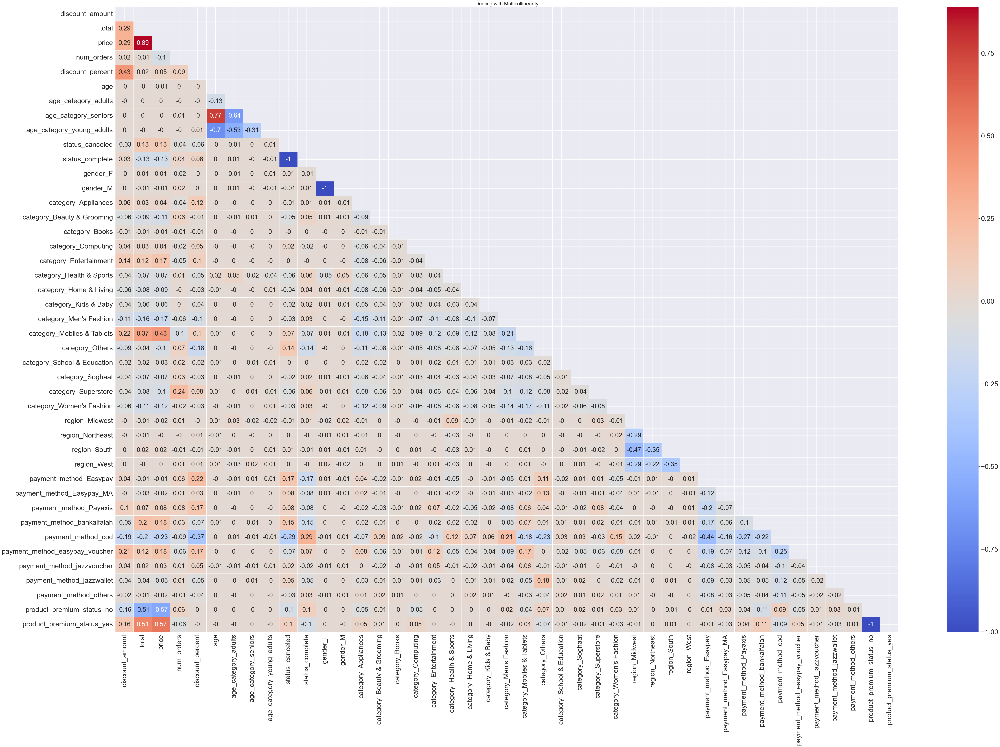

In [283]:
mask = np.zeros_like(corr_dummies_vst_t1, dtype=bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(70, 45))
sns.set(font_scale=2.5)
ax = sns.heatmap(corr_dummies_vst_t1, mask=mask, annot=True, annot_kws={"size": 25}, linewidths=.45, cmap="coolwarm")
ax.set_title("Dealing with Multicollinearity", fontsize=20)
plt.show()

 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 2.0 📊 Scaled Data Visualizations (Heatmap) </h4>


 <h5 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 2.1 ⚙️ Data Visualization Code (StandardScaler Heatmap) </h5>


In [1606]:
df_vst_dummies_t2 = df_vst_dummies_t1.copy()

#scale only numerical columns
vst_numerical_cols = ["discount_amount", "total", "price", "discount_percent"]  #scale only numerical columns
vst_categorical_cols = ["age_category", "status", "status", "category", "gender", "region", "payment_method", "premium_yes_no"]

vst_numerical_2 = df_vst_dummies_t2[vst_numerical_cols]

# StandardScaler
scaler_vst_t2 = StandardScaler()
scaler_corr_dummies_vst_t2 = scaler_vst_t2.fit_transform(vst_numerical_2)

#replace
df_vst_dummies_t2[vst_numerical_cols] = scaler_corr_dummies_vst_t2

#sspearman
corr_scaler_dummies_vst_t2 = df_vst_dummies_t2.corr(method="spearman").round(2)


 <h4 style="color: #BDC3C7; font-family: 'Arial', sans-serif;"> 2.2 📊 Visualizations (Standardized Heatmap Heatmap </h4>


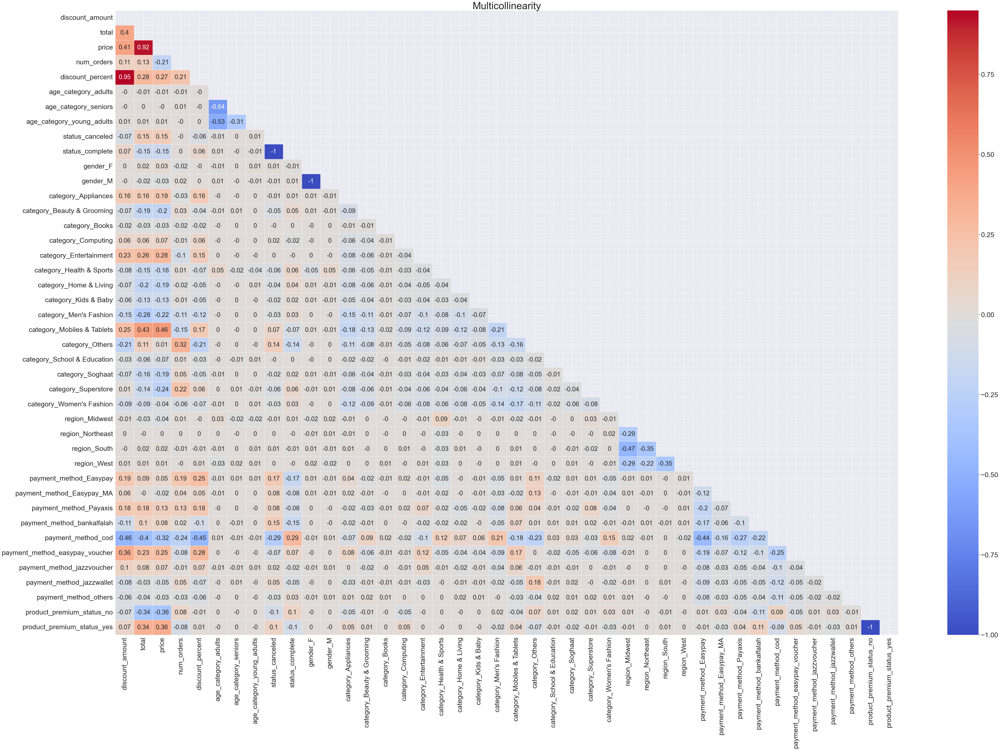

In [1639]:
mask = np.zeros_like(corr_scaler_dummies_vst_t2, dtype=bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(70, 45))
sns.set(font_scale=2.5)
ax = sns.heatmap(corr_scaler_dummies_vst_t2, mask=mask, annot=True, annot_kws={"size": 25}, linewidths=.45, cmap="coolwarm")
ax.set_title("Multicollinearity", fontsize=40)
plt.show()

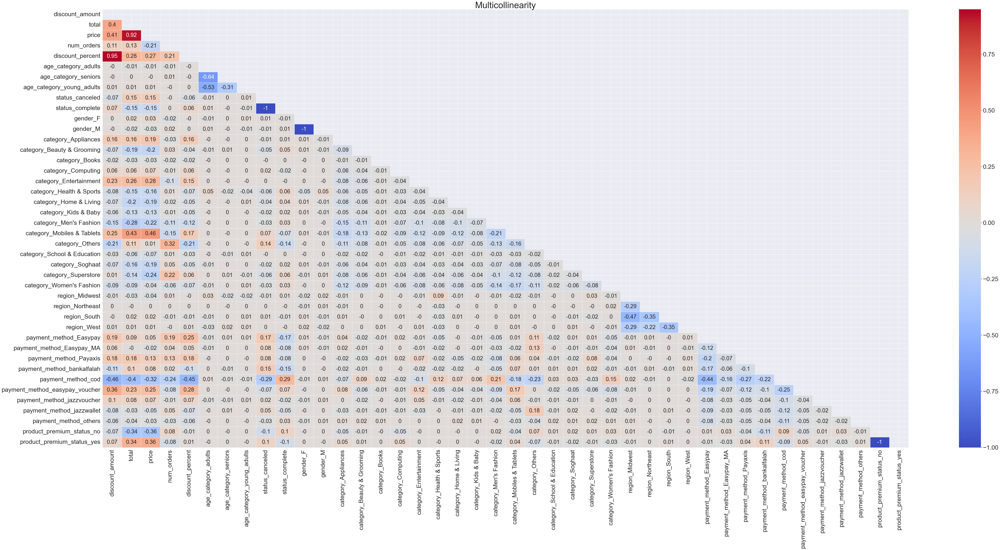

In [1645]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

mask = np.zeros_like(corr_scaler_dummies_vst_t2, dtype=bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(70, 35))
sns.set(font_scale=2.5)

ax = sns.heatmap(corr_scaler_dummies_vst_t2, mask=mask, annot=True, annot_kws={"size": 25}, 
                 linewidths=.45, cmap="coolwarm")

ax.set_title("Multicollinearity", fontsize=40)

plt.tight_layout()
plt.show()


 <h2 style="color: #34495e     ; font-family: 'Arial', sans-serif;"> SHAP Model Analysis </h2>

 <h3 style="color: #7f8c8d; font-family: 'Arial', sans-serif;">Libraries </h3>


In [285]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    confusion_matrix,
    classification_report
)
import matplotlib.pyplot as plt
import seaborn as sns
import shap

<h3 style="color: #1F4E79 ;">Model 1 - Select Columns</h3>

 <h4 style="color: #7f8c8d; font-family: 'Arial', sans-serif;"> Adjusting Model Columns </h4>


In [452]:
df.columns

Index(['order_id', 'ref_num', 'status', 'sku', 'discount_amount', 'order_date',
       'price', 'num_orders', 'discount_percent', 'value', 'total', 'category',
       'payment_method', 'cust_id', 'name_prefix', 'gender', 'age',
       'sign_in_date', 'age_category', 'place_name', 'state', 'region',
       'user_name', 'product_premium_status', 'premium_category'],
      dtype='object')

In [358]:
df_model = df.copy()

In [360]:
df.columns

Index(['order_id', 'ref_num', 'status', 'sku', 'discount_amount', 'order_date',
       'price', 'num_orders', 'discount_percent', 'value', 'total', 'category',
       'payment_method', 'cust_id', 'name_prefix', 'gender', 'age',
       'sign_in_date', 'age_category', 'place_name', 'state', 'region',
       'user_name', 'product_premium_status', 'premium_category'],
      dtype='object')

In [362]:
df_model = df_model[["status","discount_percent","gender","price", "name_prefix", "num_orders", "category", "age", "region","payment_method","total","premium_category"]] 

# gender # price  # discount_percent
df_model.sample(1)

,status,discount_percent,gender,price,name_prefix,num_orders,category,age,region,payment_method,total,premium_category
47306,complete,41.71,M,31.50,Mr.,20,Superstore,36,Midwest,Easypay,367.20,no


 <h4 style="color: #7f8c8d; font-family: 'Arial', sans-serif;"> Gender Column Transformation and Drops for Model </h4>


In [365]:
#df_model["gender_f0_m1"] = df_model["gender"].replace({"F":0, "M": 1}) # "gender" column changed to 0 = F and 1 = M.


In [367]:
df_model["status"] = df_model["status"].map({"complete":0, "canceled":1})  # "status"  0 = complete   1 = canceled 

In [370]:
#df_model.drop("gender",axis=1, inplace=True)
#df_model.drop("status",axis=1,inplace=True)

In [372]:
df_model.sample(2)

,status,discount_percent,gender,price,name_prefix,num_orders,category,age,region,payment_method,total,premium_category
179155,0,0.00,M,26.30,Mr.,1,Kids & Baby,71,South,cod,26.30,no
147788,0,0.00,M,239.10,Mr.,1,Appliances,59,South,cod,239.10,no


 <h4 style="color: #7f8c8d; font-family: 'Arial', sans-serif;"> Dummy Variables Creation for Model </h4>


In [376]:
df_model_dummies = pd.get_dummies(df_model, columns=["category", "region" ,"payment_method","premium_category","name_prefix","gender"], drop_first=False)

In [378]:
df_model_dummies = df_model_dummies * 1
df_model_dummies.sample(2)

,status,discount_percent,price,num_orders,age,total,category_Appliances,category_Beauty & Grooming,category_Books,category_Computing,category_Entertainment,category_Health & Sports,category_Home & Living,category_Kids & Baby,category_Men's Fashion,category_Mobiles & Tablets,category_Others,category_School & Education,category_Soghaat,category_Superstore,category_Women's Fashion,region_Midwest,region_Northeast,region_South,region_West,payment_method_Easypay,payment_method_Easypay_MA,payment_method_Payaxis,payment_method_bankalfalah,payment_method_cod,payment_method_easypay_voucher,payment_method_jazzvoucher,payment_method_jazzwallet,payment_method_others,premium_category_no,premium_category_yes,name_prefix_Dr.,name_prefix_Drs.,name_prefix_Hon.,name_prefix_Mr.,name_prefix_Mrs.,name_prefix_Ms.,name_prefix_Prof.,gender_F,gender_M
249930,0,40.82,49.00,4,57,116.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0
147732,1,0.00,44.90,1,70,44.90,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1


In [380]:
 df_model_dummies.shape

(262967, 45)

<h3 style="color: #1F4E79 ;">X-Y Split for Feature Set 1</h3>

In [383]:
feature_set_1 = df_model_dummies.copy()

In [385]:
X = feature_set_1.drop("status", axis=1)
y = feature_set_1["status"]

<h3 style="color: #3498DB  ;">Train-Test Split for Feature Set 1</h3>

In [388]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

<h4 style="color: #3498DB   ;">Selecting the Model: XGboost </h4>

In [391]:
import xgboost as xgb

In [393]:
# Train the model
model = xgb.XGBClassifier()
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [434]:
ypreds = model.predict(X_test)
ypreds

array([0, 0, 0, ..., 0, 1, 0])

In [437]:
ypreds_rounded = ypreds.round()
ypreds_rounded

array([0, 0, 0, ..., 0, 1, 0])

<h4 style="color: #3498DB;"> Model Accuracy Evaluation </h4>

In [441]:
from sklearn.metrics import accuracy_score

In [443]:
accuracy = accuracy_score(ypreds_rounded, y_test)

In [1658]:
print("accuracy",accuracy)

accuracy 0.7155949347834354


<h4 style="color: #3498DB;"> Model Performance Evaluation: Accuracy, F1-score, and Confusion Matrix </h4>

In [448]:
from sklearn.metrics import accuracy_score, f1_score, classification_report

In [450]:
# Accuracy and F1-score
accuracy = accuracy_score(y_test, ypreds_rounded)
f1_class_0 = f1_score(y_test, ypreds_rounded, pos_label=0)
f1_class_1 = f1_score(y_test, ypreds_rounded, pos_label=1)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, ypreds_rounded))


Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.77      0.74     40241
           1       0.74      0.65      0.69     38650

    accuracy                           0.72     78891
   macro avg       0.72      0.71      0.71     78891
weighted avg       0.72      0.72      0.71     78891



In [418]:
# Confusion Matrix
cm = confusion_matrix(y_test, ypreds_rounded)

# Visualization

# 1. Accuracy and F1-score bar chart
metrics = ["Accuracy", "F1-Score (Class 0)", "F1-Score (Class 1)"]
values = [accuracy, f1_class_0, f1_class_1]

<h4 style="color: #3498DB;"> Model Interpretation with SHAP: Summary Plot  </h4>

In [422]:
import shap

 99%|===================| 78448/78891 [02:07<00:00]        

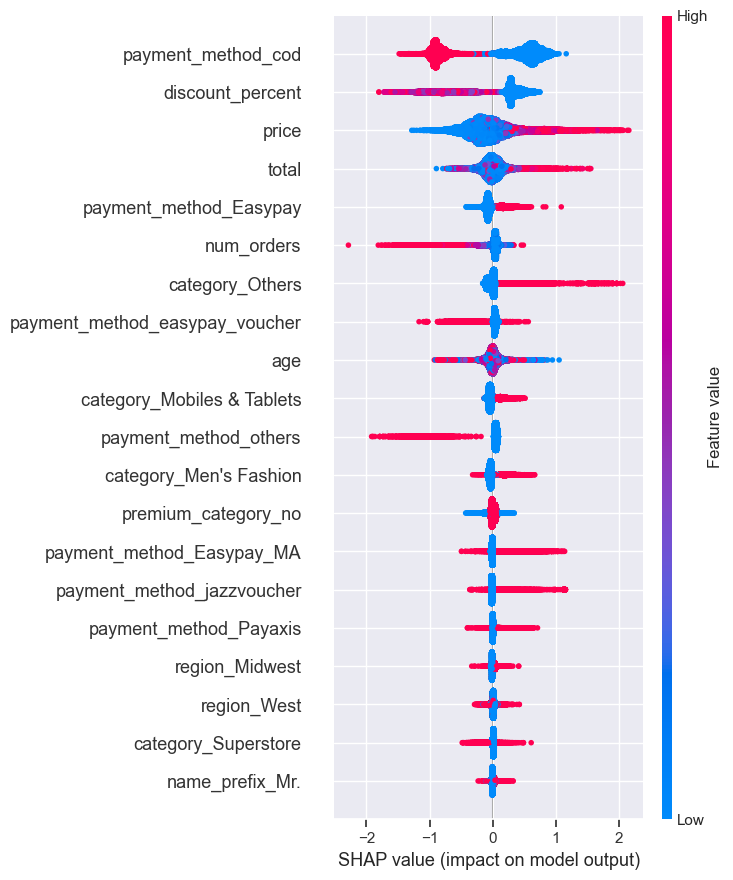

In [424]:
# Initialize SHAP Explainer
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# SHAP Summary Plot
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test)

<h4 style="color: #3498DB;"> Model Interpretation with SHAP: Waterfall Plot  </h4>

In [427]:
# Train the model
waterfall_model_0 = xgb.XGBClassifier()
waterfall_model_0.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [1942]:
explainer = shap.Explainer(waterfall_model_0)
shap_values = explainer(X_train)

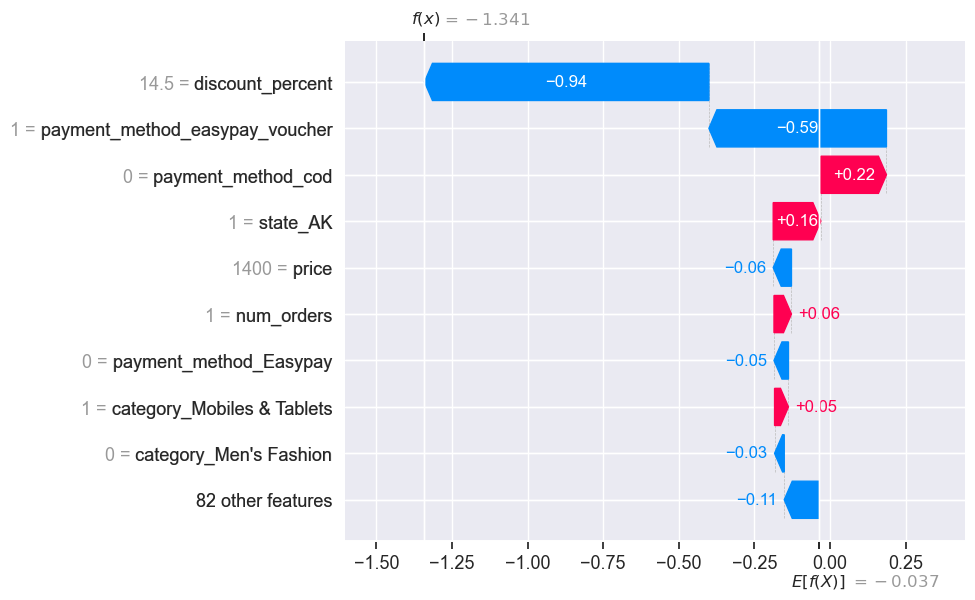

In [1944]:
shap.plots.waterfall(shap_values[0])

In [1975]:
 
df[df["discount_amount"] > df["value"]]


,order_id,ref_num,status,sku,discount_amount,order_date,price,num_orders,discount_percent,value,total,category,payment_method,cust_id,name_prefix,gender,age,sign_in_date,age_category,place_name,state,region,user_name,product_premium_status,premium_category


<h1 style="color: #34495e; font-family: 'Arial', sans-serif;">06 | Improving the Model 🔧</h1>


<h3 style="color: #1F4E79 ;">Model 2 with MinMaxScaler</h3>

In [1329]:
df_model_2 = df.copy()

In [1331]:
df.sample(1)

,order_id,ref_num,status,sku,discount_amount,order_date,price,num_orders,discount_percent,value,total,category,payment_method,cust_id,name_prefix,gender,age,sign_in_date,age_category,place_name,state,region,user_name,product_premium_status,premium_category
135946,100413259,527007,canceled,MATSAM5A0BFFF2AB4FC,1100.00,2020-12-27,8604.20,1,12.78,8604.20,7504.20,Mobiles & Tablets,Easypay_MA,76765,Mr.,M,62,2002-03-15,seniors,Cameron,OH,Midwest,wravey,yes,yes


In [1334]:
from sklearn.preprocessing import MinMaxScaler

model_2_numerical_cols = ["num_orders", "age", "total", "discount_amount"]
model_2_categorical_cols = ["gender", "category", "region", "payment_method", "premium_category"]

df_model_2_dummies = pd.get_dummies(df_model_2[model_2_categorical_cols], drop_first=False)
df_model_2_dummies = df_model_2_dummies * 1

df_model_2_with_dummies = pd.concat([df_model_2[model_2_numerical_cols], df_model_2["status"], df_model_2_dummies], axis=1)

scaler_model_2_t2 = MinMaxScaler()
df_model_2_with_dummies[model_2_numerical_cols] = scaler_model_2_t2.fit_transform(df_model_2_with_dummies[model_2_numerical_cols])

df_model_2_scaled = df_model_2_with_dummies


In [1336]:
df_model_2_scaled["status"] = df_model_2_scaled["status"].map({"complete":0, "canceled":1})  # "status"  0 = complete   1 = canceled 

In [1338]:
df_model_2_scaled

,num_orders,age,total,discount_amount,status,gender_F,gender_M,category_Appliances,category_Beauty & Grooming,category_Books,category_Computing,category_Entertainment,category_Health & Sports,category_Home & Living,category_Kids & Baby,category_Men's Fashion,category_Mobiles & Tablets,category_Others,category_School & Education,category_Soghaat,category_Superstore,category_Women's Fashion,region_Midwest,region_Northeast,region_South,region_West,payment_method_Easypay,payment_method_Easypay_MA,payment_method_Payaxis,payment_method_bankalfalah,payment_method_cod,payment_method_easypay_voucher,payment_method_jazzvoucher,payment_method_jazzwallet,payment_method_others,premium_category_no,premium_category_yes
9,0.00,0.18,0.01,0.00,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
12,0.00,0.18,0.00,0.00,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
13,0.00,0.18,0.00,0.00,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
15,0.00,0.18,0.00,0.00,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
16,0.00,0.18,0.00,0.00,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
286257,0.00,0.61,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
286275,0.00,0.40,0.00,0.00,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0
286374,0.00,0.93,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0
286379,0.00,0.72,0.00,0.00,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0


<h4 style="color: #1F4E79 ;">X-Y Split for Feature Set 1</h4>

In [1340]:
feature_set_2 = df_model_2_scaled.copy()

In [1342]:
X_2 = feature_set_2.drop("status", axis=1)
y_2 = feature_set_2["status"]

<h4 style="color: #3498DB  ;">Train-Test Split for Feature Set 1</h4>

In [1345]:
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, test_size=0.3, random_state=42)

<h4 style="color: #3498DB   ;">Selecting the Model: XGboost </h4>

In [1348]:
import xgboost as xgb

In [1350]:
# Train the model
model_2 = xgb.XGBClassifier()
model_2.fit(X_train_2, y_train_2)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [1839]:
ypreds_2 = model_2.predict(X_test_2)
ypreds_2

array([0, 0, 0, ..., 0, 1, 0])

In [1842]:
ypreds_rounded_2 = ypreds_2.round()
ypreds_rounded_2

array([0, 0, 0, ..., 0, 1, 0])

<h4 style="color: #3498DB;"> Model Accuracy Evaluation </h4>

In [1845]:
from sklearn.metrics import accuracy_score

In [1847]:
accuracy_2 = accuracy_score(ypreds_rounded_2, y_test_2)
accuracy_2

0.7119189768161134

<h4 style="color: #3498DB;"> Model Performance Evaluation: Accuracy, F1-score, and Confusion Matrix </h4>

In [1850]:
from sklearn.metrics import accuracy_score, f1_score, classification_report

In [1852]:
# Accuracy and F1-score
accuracy_2 = accuracy_score(y_test_2, ypreds_rounded_2)
f1_class_0_2 = f1_score(y_test_2, ypreds_rounded_2, pos_label=0)
f1_class_1_2 = f1_score(y_test_2, ypreds_rounded_2, pos_label=1)

# lassification report
print("Classification Report:")
print(classification_report(y_test_2, ypreds_rounded_2))


Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.77      0.73     40241
           1       0.73      0.65      0.69     38650

    accuracy                           0.71     78891
   macro avg       0.71      0.71      0.71     78891
weighted avg       0.71      0.71      0.71     78891



In [1854]:
# Confusion Matrix
cm_2 = confusion_matrix(y_test_2, ypreds_rounded_2)

# Visualization

# 1. Accuracy and F1-score bar chart
metrics_2 = ["Accuracy", "F1-Score (Class 0)", "F1-Score (Class 1)"]
values_2 = [accuracy_2, f1_class_0_2, f1_class_1_2]

<h4 style="color: #3498DB;"> Model Interpretation with SHAP: Summary Plot  </h4>

In [1857]:
import shap

100%|===================| 78601/78891 [02:07<00:00]        

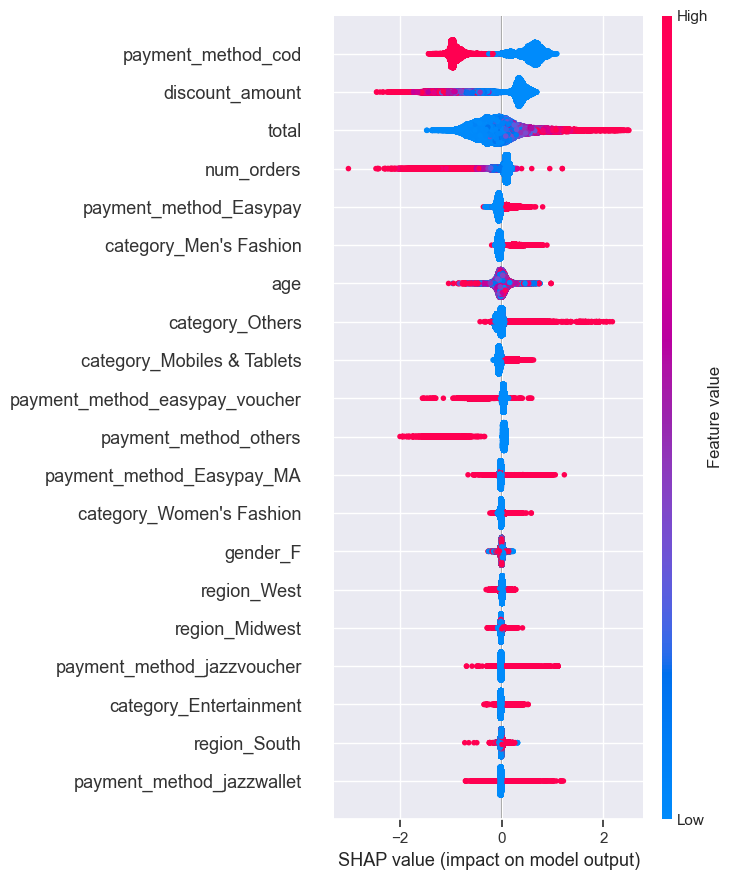

In [1859]:
# Initialize SHAP Explainer
explainer_2 = shap.Explainer(model_2, X_train_2)
shap_values_2 = explainer_2(X_test_2)

# SHAP Summary Plot
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_2, X_test_2)

<h4 style="color: #3498DB;"> Model Interpretation with SHAP: Waterfall Plot  </h4>

In [1867]:
# Train the model
waterfall_model_2 = xgb.XGBClassifier()
waterfall_model_2.fit(X_train_2, y_train_2)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [1868]:
explainer_2 = shap.Explainer(waterfall_model_2)
shap_values_2 = explainer_2(X_train_2)

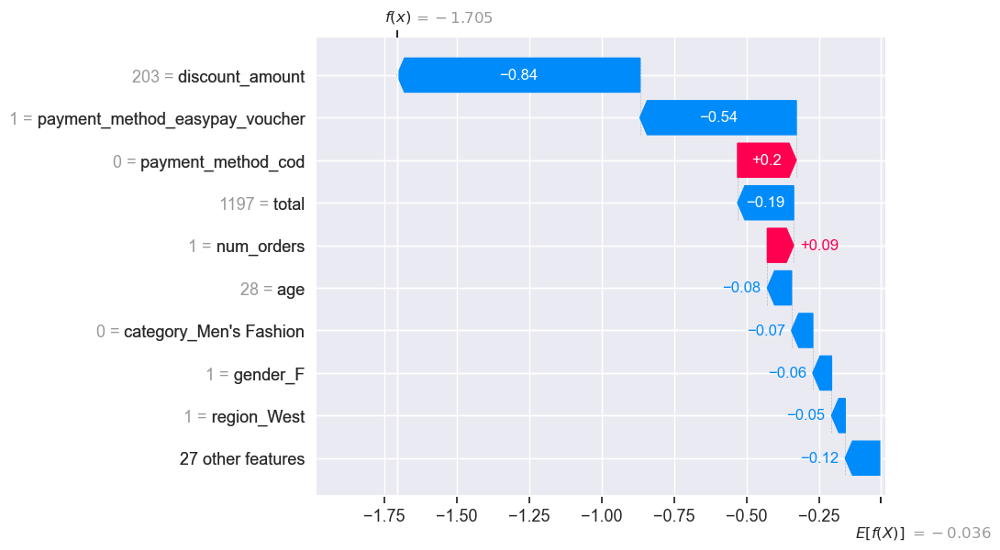

In [1870]:
shap.plots.waterfall(shap_values[0])

# :)

<div style="position: fixed; bottom: 10px; right: 10px; color: #95a5a6; font-family: 'Arial', sans-serif; font-size: 14px;">
  Created by <strong>RJ</strong> | 
</div>
